In [6]:
!pip install --upgrade pip
!pip install pandas numpy matplotlib seaborn folium

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap, MarkerCluster
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12
%matplotlib inline

df = pd.read_csv('/Users/shreeramghimire/Desktop/LiceData/Weekly_Count_Salmon_Lice_2015_2025.csv')
print(f" Data loaded: {df.shape[0]:,} rows, {df.shape[1]} columns")

df['Date'] = pd.to_datetime(df['Year'].astype(str) + '-' + df['Week'].astype(str) + '-1', format='%Y-%W-%w')

df['Exceedance'] = (df['Adult_Female_Lice'] >= 0.5).astype(int)

def assign_zone(lat):
    if lat < 60:
        return 'Zone 1: Southern (58-60°N)'
    elif lat < 63:
        return 'Zone 2: Western (60-63°N)'
    elif lat < 66:
        return 'Zone 3: Mid (63-66°N)'
    elif lat < 69:
        return 'Zone 4: Northern (66-69°N)'
    else:
        return 'Zone 5: Arctic (69-71°N)'

df['Zone'] = df['Latitude'].apply(assign_zone)
df['Zone_Code'] = df['Zone'].str.split(':').str[0].str.strip()

print(f" Data prepared")
print(f"   Years: {df['Year'].min()} to {df['Year'].max()}")
print(f"   Localities: {df['Locality_Number'].nunique():,}")
print(f"   Exceedance rate: {df['Exceedance'].mean()*100:.1f}%")

print("\n" + "="*60)
print("STEP 1: Finding Recurrence Patterns (2015-2025)")
print("="*60)

def calculate_recurrence_patterns(df):
    """Calculate how predictable each locality is"""
    
    recurrence_data = []
    
    for loc_id in df['Locality_Number'].unique():
        loc_data = df[df['Locality_Number'] == loc_id]
        loc_name = loc_data['Locality_Name'].iloc[0]
        
        # Count total years of data
        years = sorted(loc_data['Year'].unique())
        total_years = len(years)
        
        if total_years < 3:  
            continue
        exceedance_matrix = {}
        for year in years:
            year_data = loc_data[loc_data['Year'] == year]
            exceedance_weeks = year_data[year_data['Exceedance'] == 1]['Week'].tolist()
            exceedance_matrix[year] = set(exceedance_weeks)

        all_weeks = set(range(1, 53))
        recurrence_by_week = {}
        
        for week in all_weeks:
            years_with_exceedance = []
            temperatures = []
            
            for year in years:
                if week in exceedance_matrix.get(year, set()):
                    years_with_exceedance.append(year)
                    # Get temperature for that week/year
                    temp = loc_data[(loc_data['Year'] == year) & 
                                   (loc_data['Week'] == week)]['Sea_Temperature']
                    if len(temp) > 0:
                        temperatures.append(temp.iloc[0])
            
            if len(years_with_exceedance) >= 2:  
                recurrence_by_week[week] = {
                    'years': years_with_exceedance,
                    'count': len(years_with_exceedance),
                    'temperatures': temperatures,
                    'temp_consistency': np.std(temperatures) if len(temperatures) > 1 else 0
                }
        
        total_exceedances = len(loc_data[loc_data['Exceedance'] == 1])
        recurrent_count = sum(info['count'] for info in recurrence_by_week.values())
        
        if total_exceedances > 0:
            recurrence_ratio = recurrent_count / total_exceedances
        else:
            recurrence_ratio = 0
        
        if recurrence_by_week:
            avg_consistency = np.mean([info['temp_consistency'] for info in recurrence_by_week.values()])
            consistency_score = max(0, 1 - (avg_consistency / 5))  # Normalize
        else:
            consistency_score = 0
        
        predictability_score = 0.7 * recurrence_ratio + 0.3 * consistency_score
        
        recurrence_data.append({
            'Locality_Number': loc_id,
            'Locality_Name': loc_name,
            'Latitude': loc_data['Latitude'].iloc[0],
            'Longitude': loc_data['Longitude'].iloc[0],
            'Zone': loc_data['Zone'].iloc[0],
            'Zone_Code': loc_data['Zone_Code'].iloc[0],
            'Total_Years': total_years,
            'Total_Exceedances': total_exceedances,
            'Recurrent_Weeks': len(recurrence_by_week),
            'Predictability_Score': predictability_score,
            'Recurrence_Ratio': recurrence_ratio,
            'Temperature_Consistency': consistency_score,
            'Recurrence_Pattern': recurrence_by_week
        })
    
    return pd.DataFrame(recurrence_data)
recurrence_df = calculate_recurrence_patterns(df)

print(f"\n Recurrence Analysis Results:")
print(f"   Localities analyzed: {len(recurrence_df):,}")
print(f"   Mean predictability: {recurrence_df['Predictability_Score'].mean():.2f}")
print(f"   Most predictable: {recurrence_df.loc[recurrence_df['Predictability_Score'].idxmax(), 'Locality_Name']}")
print(f"   Least predictable: {recurrence_df.loc[recurrence_df['Predictability_Score'].idxmin(), 'Locality_Name']}")


print("\n Creating recurrence pattern map:")

m = folium.Map(location=[65, 12], zoom_start=5, tiles='CartoDB positron')

for _, row in recurrence_df.iterrows():
    if row['Predictability_Score'] > 0.7:
        color = 'darkred'
        size = 8
    elif row['Predictability_Score'] > 0.5:
        color = 'orange'
        size = 6
    elif row['Predictability_Score'] > 0.3:
        color = 'lightblue'
        size = 4
    else:
        color = 'lightgray'
        size = 3
    
    popup_text = f"""
    <b>{row['Locality_Name']}</b><br>
    Zone: {row['Zone']}<br>
    Predictability: {row['Predictability_Score']:.2f}<br>
    Recurrent Weeks: {row['Recurrent_Weeks']}<br>
    Total Exceedances: {row['Total_Exceedances']}<br>
    Years of Data: {row['Total_Years']}
    """
    
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=size,
        popup=folium.Popup(popup_text, max_width=300),
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        tooltip=f"{row['Locality_Name']}: {row['Predictability_Score']:.2f}"
    ).add_to(m)

legend_html = '''
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 180px; height: 160px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white;
     padding: 10px;">
     <b>Predictability Score</b><br>
     <i class="fa fa-circle" style="color:darkred"></i> High (>0.7)<br>
     <i class="fa fa-circle" style="color:orange"></i> Medium (0.5-0.7)<br>
     <i class="fa fa-circle" style="color:lightblue"></i> Low (0.3-0.5)<br>
     <i class="fa fa-circle" style="color:lightgray"></i> Very Low (<0.3)<br>
     <br>Size = Predictability
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

print(" Map created. Displaying:")
display(m)


print("\n Recurrence Pattern Summary:")

zone_summary = recurrence_df.groupby('Zone').agg({
    'Predictability_Score': ['mean', 'std', 'count'],
    'Recurrent_Weeks': 'mean',
    'Total_Exceedances': 'sum'
}).round(3)

print("\nBy Latitudinal Zone:")
print(zone_summary)

print("\n Top 10 Most Predictable Localities:")
top_10 = recurrence_df.nlargest(10, 'Predictability_Score')[['Locality_Name', 'Zone', 'Predictability_Score', 'Recurrent_Weeks']]
print(top_10.round(3))

print("\n Bottom 10 Least Predictable Localities:")
bottom_10 = recurrence_df.nsmallest(10, 'Predictability_Score')[['Locality_Name', 'Zone', 'Predictability_Score', 'Recurrent_Weeks']]
print(bottom_10.round(3))

print("\n" + "="*60)
print("STEP 1 COMPLETE: Recurrence patterns analyzed")
print("="*60)

map_path = '/kaggle/working/recurrence_pattern_map_complete.html'
m.save(map_path)

try:
    from selenium import webdriver
    from selenium.webdriver.chrome.options import Options
    
    chrome_options = Options()
    chrome_options.add_argument('--headless')
    chrome_options.add_argument('--no-sandbox')
    chrome_options.add_argument('--disable-dev-shm-usage')
    
    driver = webdriver.Chrome(options=chrome_options)
    driver.get(f'file://{map_path}')
    driver.save_screenshot('/kaggle/working/recurrence_pattern_map.png')
    driver.quit()
    
    print(" Map screenshot saved: /kaggle/working/recurrence_pattern_map.png")
except:
    print(" Interactive map saved as HTML")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 39.2 MB/s  0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 25.3
    Uninstalling pip-25.3:
      Successfully uninstalled pip-25.3
 Data loaded: 316,719 rows, 13 columns
 Data prepared
   Years: 2015 to 2025
   Localities: 1,094
   Exceedance rate: 3.3%

STEP 1: Finding Recurrence Patterns (2015-2025)

 Recurrence Analysis Results:
   Localities analyzed: 1,024
   Mean predictability: 0.23
   Most predictable: Sauaneset I
   Least predictable: Aga Ø

 Creating recurrence pattern map:
 Map created. Displaying:



 Recurrence Pattern Summary:

By Latitudinal Zone:
                           Predictability_Score              Recurrent_Weeks  \
                                           mean    std count            mean   
Zone                                                                           
Zone 1: Southern (58-60°N)                0.202  0.253   127           1.165   
Zone 2: Western (60-63°N)                 0.272  0.268   281           2.146   
Zone 3: Mid (63-66°N)                     0.255  0.282   231           1.602   
Zone 4: Northern (66-69°N)                0.220  0.265   223           1.094   
Zone 5: Arctic (69-71°N)                  0.134  0.231   162           0.531   

                           Total_Exceedances  
                                         sum  
Zone                                          
Zone 1: Southern (58-60°N)              1216  
Zone 2: Western (60-63°N)               3757  
Zone 3: Mid (63-66°N)                   2503  
Zone 4: Northern (66-69°N

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/recurrence_pattern_map_complete.html'


STEP 2: Analyzing Temperature Patterns (2015-2025)

 Temperature Analysis Results:
   Localities analyzed: 1,024
   Mean consistency: 0.90
   Average warming trend: 0.017°C per decade
   Significant trends in 78 localities

 Creating temperature pattern map...
 Temperature map created. Displaying...



 Creating temperature analysis plots...


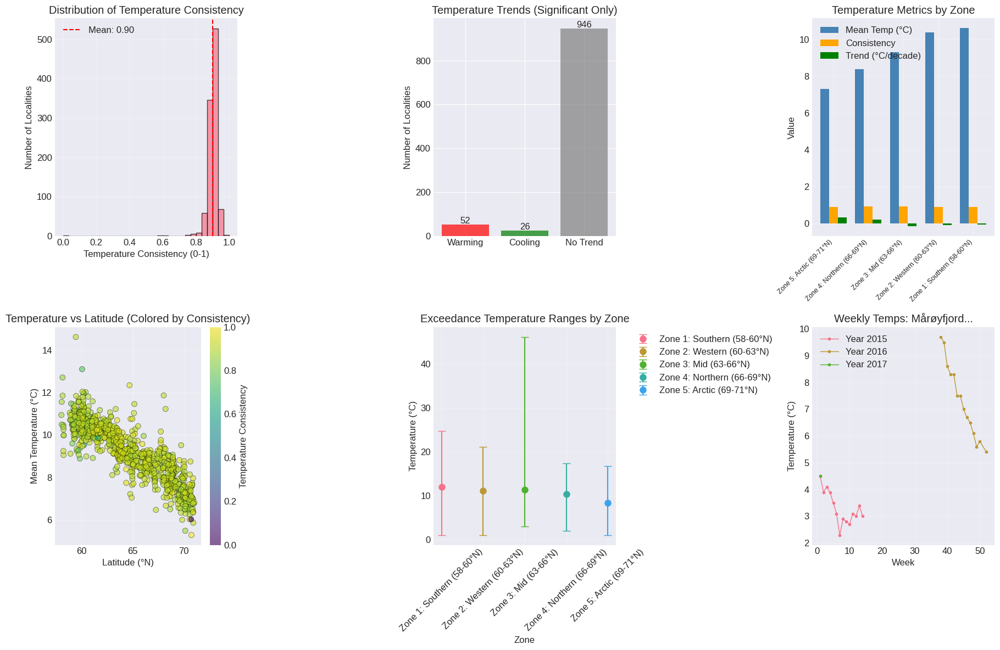


 Temperature Pattern Summary:

Temperature Statistics by Zone:
                           Mean_Temperature                        \
                                       mean    std    min     max   
Zone                                                                
Zone 1: Southern (58-60°N)           10.604  0.714  8.890  14.628   
Zone 2: Western (60-63°N)            10.382  0.533  8.917  13.107   
Zone 3: Mid (63-66°N)                 9.295  0.688  7.045  12.348   
Zone 4: Northern (66-69°N)            8.362  0.692  6.469  11.869   
Zone 5: Arctic (69-71°N)              7.288  0.676  5.283   9.520   

                           Temp_Consistency Temp_Trend Trend_Significant  
                                       mean   <lambda>               sum  
Zone                                                                      
Zone 1: Southern (58-60°N)            0.883     -0.069                10  
Zone 2: Western (60-63°N)             0.896     -0.104                27  
Zone 3: 

In [2]:
# ============================================
# STEP 2: TEMPERATURE PATTERN ANALYSIS
# ============================================

print("\n" + "="*60)
print("STEP 2: Analyzing Temperature Patterns (2015-2025)")
print("="*60)

def analyze_temperature_patterns(df):
    """Analyze temperature consistency and trends for each locality"""
    
    temp_patterns = []
    
    for loc_id in df['Locality_Number'].unique():
        loc_data = df[df['Locality_Number'] == loc_id]
        loc_name = loc_data['Locality_Name'].iloc[0]
        
        years = sorted(loc_data['Year'].unique())
        if len(years) < 3:
            continue
            
        yearly_stats = []
        for year in years:
            year_data = loc_data[loc_data['Year'] == year]
            if len(year_data) > 0:
                yearly_stats.append({
                    'Year': year,
                    'Mean_Temp': year_data['Sea_Temperature'].mean(),
                    'Min_Temp': year_data['Sea_Temperature'].min(),
                    'Max_Temp': year_data['Sea_Temperature'].max(),
                    'Temp_Range': year_data['Sea_Temperature'].max() - year_data['Sea_Temperature'].min()
                })
        
        yearly_df = pd.DataFrame(yearly_stats)
        
        if len(yearly_df) < 2:
            continue
            
        weekly_temps = {}
        for week in range(1, 53):
            week_data = loc_data[loc_data['Week'] == week]
            if len(week_data) > 0:
                weekly_temps[week] = week_data.groupby('Year')['Sea_Temperature'].mean().to_dict()
        
        consistency_scores = []
        for week, year_temps in weekly_temps.items():
            if len(year_temps) >= 2:
                temps = list(year_temps.values())
                # Lower std = more consistent
                if np.mean(temps) != 0:
                    cv = np.std(temps) / np.mean(temps)  # Coefficient of variation
                    consistency = max(0, 1 - min(cv, 1))  # Convert to 0-1 scale
                    consistency_scores.append(consistency)
        
        temp_consistency = np.mean(consistency_scores) if consistency_scores else 0
        
        if len(yearly_df) >= 3:
            from scipy import stats
            slope, intercept, r_value, p_value, std_err = stats.linregress(
                yearly_df['Year'], yearly_df['Mean_Temp']
            )
            temp_trend = slope  # °C per year
            trend_strength = abs(r_value)
            trend_significant = p_value < 0.05
        else:
            temp_trend = 0
            trend_strength = 0
            trend_significant = False
        
        exceedance_temps = loc_data[loc_data['Exceedance'] == 1]['Sea_Temperature']
        non_exceedance_temps = loc_data[loc_data['Exceedance'] == 0]['Sea_Temperature']
        
        if len(exceedance_temps) > 0:
            exceedance_temp_range = (exceedance_temps.min(), exceedance_temps.max())
            exceedance_temp_mean = exceedance_temps.mean()
        else:
            exceedance_temp_range = (None, None)
            exceedance_temp_mean = None
        
        temp_patterns.append({
            'Locality_Number': loc_id,
            'Locality_Name': loc_name,
            'Latitude': loc_data['Latitude'].iloc[0],
            'Longitude': loc_data['Longitude'].iloc[0],
            'Zone': loc_data['Zone'].iloc[0],
            'Years_Data': len(years),
            'Mean_Temperature': loc_data['Sea_Temperature'].mean(),
            'Temp_Range': loc_data['Sea_Temperature'].max() - loc_data['Sea_Temperature'].min(),
            'Temp_Consistency': temp_consistency,
            'Temp_Trend': temp_trend,  # °C/year
            'Trend_Strength': trend_strength,
            'Trend_Significant': trend_significant,
            'Exceedance_Temp_Mean': exceedance_temp_mean,
            'Exceedance_Temp_Min': exceedance_temp_range[0],
            'Exceedance_Temp_Max': exceedance_temp_range[1],
            'Weekly_Temp_Patterns': weekly_temps
        })
    
    return pd.DataFrame(temp_patterns)
    
temp_df = analyze_temperature_patterns(df)

print(f"\n Temperature Analysis Results:")
print(f"   Localities analyzed: {len(temp_df):,}")
print(f"   Mean consistency: {temp_df['Temp_Consistency'].mean():.2f}")
print(f"   Average warming trend: {temp_df['Temp_Trend'].mean()*10:.3f}°C per decade")
print(f"   Significant trends in {temp_df['Trend_Significant'].sum():,} localities")

print("\n Creating temperature pattern map...")

temp_map = folium.Map(location=[65, 12], zoom_start=5, tiles='CartoDB positron')

def get_temp_color(consistency):
    if consistency > 0.8:
        return 'darkblue'
    elif consistency > 0.6:
        return 'blue'
    elif consistency > 0.4:
        return 'lightblue'
    elif consistency > 0.2:
        return 'lightgreen'
    else:
        return 'lightgray'

def get_trend_color(trend, significant):
    if not significant:
        return 'gray'
    elif trend > 0.01:  
        return 'darkred'
    elif trend > 0:  
        return 'red'
    elif trend < -0.01:  
        return 'darkgreen'
    else:  
        return 'green'

for _, row in temp_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=6,
        popup=folium.Popup(f"""
        <b>{row['Locality_Name']}</b><br>
        Zone: {row['Zone']}<br>
        Mean Temp: {row['Mean_Temperature']:.1f}°C<br>
        Temp Consistency: {row['Temp_Consistency']:.2f}<br>
        Trend: {row['Temp_Trend']*10:.3f}°C/decade<br>
        Trend Significant: {row['Trend_Significant']}<br>
        Exceedance Temp Range: {row['Exceedance_Temp_Min']:.1f}-{row['Exceedance_Temp_Max']:.1f}°C
        """, max_width=300),
        color=get_temp_color(row['Temp_Consistency']),
        fill=True,
        fill_color=get_temp_color(row['Temp_Consistency']),
        fill_opacity=0.7,
        tooltip=f"{row['Locality_Name']}: Consistency={row['Temp_Consistency']:.2f}"
    ).add_to(temp_map)
    
    if row['Trend_Significant']:
        folium.CircleMarker(
            location=[row['Latitude'] + 0.01, row['Longitude'] + 0.01],  # Offset slightly
            radius=3,
            color=get_trend_color(row['Temp_Trend'], row['Trend_Significant']),
            fill=True,
            fill_opacity=0.9
        ).add_to(temp_map)

consistency_legend = '''
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 200px; height: 180px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white;
     padding: 10px;">
     <b>Temperature Consistency</b><br>
     <i class="fa fa-circle" style="color:darkblue"></i> Very High (>0.8)<br>
     <i class="fa fa-circle" style="color:blue"></i> High (0.6-0.8)<br>
     <i class="fa fa-circle" style="color:lightblue"></i> Medium (0.4-0.6)<br>
     <i class="fa fa-circle" style="color:lightgreen"></i> Low (0.2-0.4)<br>
     <i class="fa fa-circle" style="color:lightgray"></i> Very Low (<0.2)<br>
     <br><b>Trend Indicators</b><br>
     <i class="fa fa-circle" style="color:darkred"></i> Strong Warming<br>
     <i class="fa fa-circle" style="color:red"></i> Mild Warming<br>
     <i class="fa fa-circle" style="color:darkgreen"></i> Strong Cooling<br>
     <i class="fa fa-circle" style="color:green"></i> Mild Cooling
</div>
'''
temp_map.get_root().html.add_child(folium.Element(consistency_legend))

print(" Temperature map created. Displaying...")
display(temp_map)

print("\n Creating temperature analysis plots...")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

axes[0,0].hist(temp_df['Temp_Consistency'], bins=30, edgecolor='black', alpha=0.7)
axes[0,0].axvline(x=temp_df['Temp_Consistency'].mean(), color='red', linestyle='--', 
                  label=f'Mean: {temp_df["Temp_Consistency"].mean():.2f}')
axes[0,0].set_xlabel('Temperature Consistency (0-1)')
axes[0,0].set_ylabel('Number of Localities')
axes[0,0].set_title('Distribution of Temperature Consistency')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

trend_data = temp_df[temp_df['Trend_Significant']]
if len(trend_data) > 0:
    warming = trend_data[trend_data['Temp_Trend'] > 0]
    cooling = trend_data[trend_data['Temp_Trend'] < 0]
    
    labels = ['Warming', 'Cooling', 'No Trend']
    counts = [len(warming), len(cooling), len(temp_df) - len(trend_data)]
    colors = ['red', 'green', 'gray']
    
    axes[0,1].bar(labels, counts, color=colors, alpha=0.7)
    axes[0,1].set_ylabel('Number of Localities')
    axes[0,1].set_title('Temperature Trends (Significant Only)')
    
    for i, count in enumerate(counts):
        axes[0,1].text(i, count + 5, str(count), ha='center')

zone_temps = temp_df.groupby('Zone').agg({
    'Mean_Temperature': 'mean',
    'Temp_Consistency': 'mean',
    'Temp_Trend': 'mean'
}).sort_values('Mean_Temperature')

x = np.arange(len(zone_temps))
width = 0.25
axes[0,2].bar(x - width, zone_temps['Mean_Temperature'], width, label='Mean Temp (°C)', color='steelblue')
axes[0,2].bar(x, zone_temps['Temp_Consistency'], width, label='Consistency', color='orange')
axes[0,2].bar(x + width, zone_temps['Temp_Trend'] * 10, width, label='Trend (°C/decade)', color='green')
axes[0,2].set_xticks(x)
axes[0,2].set_xticklabels(zone_temps.index, rotation=45, ha='right', fontsize=9)
axes[0,2].set_ylabel('Value')
axes[0,2].set_title('Temperature Metrics by Zone')
axes[0,2].legend()
axes[0,2].grid(True, alpha=0.3)

scatter = axes[1,0].scatter(temp_df['Latitude'], temp_df['Mean_Temperature'],
                           c=temp_df['Temp_Consistency'], cmap='viridis',
                           s=50, alpha=0.6, edgecolor='black', linewidth=0.5)
axes[1,0].set_xlabel('Latitude (°N)')
axes[1,0].set_ylabel('Mean Temperature (°C)')
axes[1,0].set_title('Temperature vs Latitude (Colored by Consistency)')
plt.colorbar(scatter, ax=axes[1,0], label='Temperature Consistency')
axes[1,0].grid(True, alpha=0.3)

exceedance_temps = temp_df.dropna(subset=['Exceedance_Temp_Mean'])
if len(exceedance_temps) > 0:
    zones = exceedance_temps['Zone'].unique()[:5]  # Top 5 zones
    for zone in zones:
        zone_data = exceedance_temps[exceedance_temps['Zone'] == zone]
        if len(zone_data) > 0:
            mean_temp = zone_data['Exceedance_Temp_Mean'].mean()
            min_temp = zone_data['Exceedance_Temp_Min'].min()
            max_temp = zone_data['Exceedance_Temp_Max'].max()
            
            axes[1,1].errorbar(zone, mean_temp, 
                              yerr=[[mean_temp - min_temp], [max_temp - mean_temp]],
                              fmt='o', capsize=5, label=zone, markersize=8)
    
    axes[1,1].set_xlabel('Zone')
    axes[1,1].set_ylabel('Temperature (°C)')
    axes[1,1].set_title('Exceedance Temperature Ranges by Zone')
    axes[1,1].tick_params(axis='x', rotation=45)
    axes[1,1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[1,1].grid(True, alpha=0.3)

sample_loc = temp_df.loc[temp_df['Temp_Consistency'].idxmax()]
if 'Weekly_Temp_Patterns' in sample_loc:
    weekly_data = sample_loc['Weekly_Temp_Patterns']
    years = sorted(set([year for week_data in weekly_data.values() for year in week_data.keys()]))
    
    for year in years[:3]:  # Show first 3 years
        temps = []
        weeks = []
        for week in sorted(weekly_data.keys()):
            if year in weekly_data[week]:
                temps.append(weekly_data[week][year])
                weeks.append(week)
        
        axes[1,2].plot(weeks, temps, marker='o', markersize=3, label=f'Year {year}', linewidth=1)
    
    axes[1,2].set_xlabel('Week')
    axes[1,2].set_ylabel('Temperature (°C)')
    axes[1,2].set_title(f'Weekly Temps: {sample_loc["Locality_Name"][:20]}...')
    axes[1,2].legend()
    axes[1,2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n Temperature Pattern Summary:")


zone_temp_summary = temp_df.groupby('Zone').agg({
    'Mean_Temperature': ['mean', 'std', 'min', 'max'],
    'Temp_Consistency': 'mean',
    'Temp_Trend': lambda x: np.mean(x) * 10,  # Convert to °C/decade
    'Trend_Significant': 'sum'
}).round(3)

print("\nTemperature Statistics by Zone:")
print(zone_temp_summary)

print("\n Top 5 Most Temperature-Consistent Localities:")
top_consistent = temp_df.nlargest(5, 'Temp_Consistency')[['Locality_Name', 'Zone', 'Temp_Consistency', 'Mean_Temperature']]
print(top_consistent.round(3))

print("\n Top 5 Strongest Warming Trends:")
strong_warming = temp_df[temp_df['Trend_Significant']].nlargest(5, 'Temp_Trend')
if len(strong_warming) > 0:
    print(strong_warming[['Locality_Name', 'Zone', 'Temp_Trend', 'Trend_Strength']].round(4))
else:
    print("No significant warming trends found")

print("\n❄️ Top 5 Strongest Cooling Trends:")
strong_cooling = temp_df[temp_df['Trend_Significant']].nsmallest(5, 'Temp_Trend')
if len(strong_cooling) > 0:
    print(strong_cooling[['Locality_Name', 'Zone', 'Temp_Trend', 'Trend_Strength']].round(4))
else:
    print("No significant cooling trends found")


print("\n Exceedance Temperature Analysis:")
exceedance_stats = temp_df.dropna(subset=['Exceedance_Temp_Mean']).agg({
    'Exceedance_Temp_Mean': ['mean', 'std', 'min', 'max'],
    'Exceedance_Temp_Min': 'mean',
    'Exceedance_Temp_Max': 'mean'
}).round(2)
print(exceedance_stats)

print(f"\n💡 Key Insight: Lice exceedances typically occur at {exceedance_stats.loc['mean', 'Exceedance_Temp_Mean']:.1f}°C")
print(f"   Range: {exceedance_stats.loc['min', 'Exceedance_Temp_Min']:.1f}°C to {exceedance_stats.loc['max', 'Exceedance_Temp_Max']:.1f}°C")

print("\n" + "="*60)
print("STEP 2 COMPLETE: Temperature patterns analyzed")
print("="*60)

temp_map.save('/kaggle/working/temperature_patterns_map.html')
print(" Temperature map saved: /kaggle/working/temperature_patterns_map.html")


STEP 3: Finding Temperature-Synchronized Outbreaks

🔗 Temperature-Lice Synchrony Results:
   Localities analyzed: 455
   Localities with synchronized outbreaks: 406
   Average synchrony ratio: 0.81

 Creating synchronized outbreaks map...
 Synchronized outbreaks map created. Displaying...



📊 Creating synchrony analysis plots...


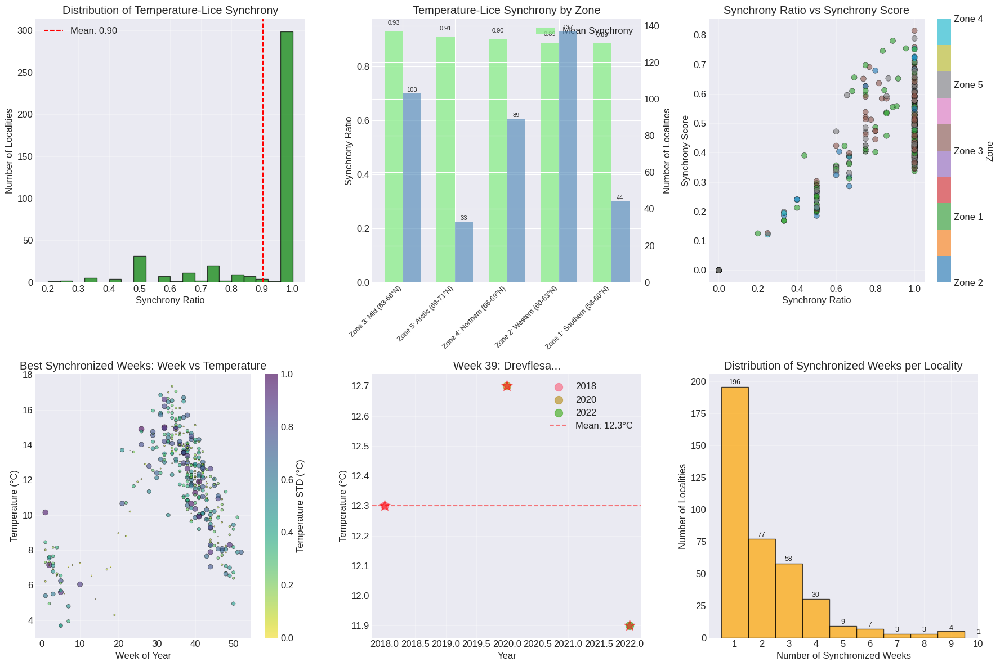


 Synchrony Analysis Summary:

Synchrony Statistics by Zone:
                           Synchrony_Ratio              Synchronized_Weeks  \
                                      mean    std count               mean   
Zone                                                                         
Zone 1: Southern (58-60°N)           0.886  0.201    44              2.500   
Zone 2: Western (60-63°N)            0.887  0.196   137              3.416   
Zone 3: Mid (63-66°N)                0.929  0.151   103              3.058   
Zone 4: Northern (66-69°N)           0.900  0.180    89              2.202   
Zone 5: Arctic (69-71°N)             0.909  0.223    33              1.697   

                           Synchrony_Score  
                                      mean  
Zone                                        
Zone 1: Southern (58-60°N)           0.449  
Zone 2: Western (60-63°N)            0.452  
Zone 3: Mid (63-66°N)                0.499  
Zone 4: Northern (66-69°N)           0.463  

In [3]:
# ============================================
# STEP 3: TEMPERATURE-LICE SYNCHRONY ANALYSIS
# ============================================

print("\n" + "="*60)
print("STEP 3: Finding Temperature-Synchronized Outbreaks")
print("="*60)

def find_temperature_synchronized_outbreaks(df, recurrence_df):
    """Find localities where outbreaks recur with similar temperatures"""
    
    synchrony_results = []
    
    for _, loc_info in recurrence_df.iterrows():
        loc_id = loc_info['Locality_Number']
        loc_data = df[df['Locality_Number'] == loc_id]
        
        recurrence_pattern = loc_info['Recurrence_Pattern']
        
        if not recurrence_pattern:
            continue
            
        synchronized_weeks = []
        
        for week, week_info in recurrence_pattern.items():
            years = week_info['years']
            temperatures = week_info['temperatures']
            
            if len(temperatures) >= 2: 
                temp_mean = np.mean(temperatures)
                temp_std = np.std(temperatures)
                
                
                if temp_std <= 1.0:  # Temperature variation < 1°C
                    synchronized_weeks.append({
                        'Week': week,
                        'Years': years,
                        'Temperatures': temperatures,
                        'Mean_Temperature': temp_mean,
                        'Temperature_STD': temp_std,
                        'Is_Synchronized': True
                    })
                else:
                    synchronized_weeks.append({
                        'Week': week,
                        'Years': years,
                        'Temperatures': temperatures,
                        'Mean_Temperature': temp_mean,
                        'Temperature_STD': temp_std,
                        'Is_Synchronized': False
                    })
        
        total_recurrent_weeks = len(recurrence_pattern)
        synchronized_count = sum(1 for week in synchronized_weeks if week['Is_Synchronized'])
        
        if total_recurrent_weeks > 0:
            synchrony_ratio = synchronized_count / total_recurrent_weeks
        else:
            synchrony_ratio = 0
        
        synchronized_temps = [week['Temperature_STD'] for week in synchronized_weeks if week['Is_Synchronized']]
        if synchronized_temps:
            avg_sync_consistency = np.mean(synchronized_temps)
        else:
            avg_sync_consistency = None
        
        if synchronized_weeks:
            best_sync_week = min(synchronized_weeks, 
                                key=lambda x: x['Temperature_STD'] if x['Is_Synchronized'] else float('inf'))
        else:
            best_sync_week = None
        
        synchrony_results.append({
            'Locality_Number': loc_id,
            'Locality_Name': loc_info['Locality_Name'],
            'Latitude': loc_info['Latitude'],
            'Longitude': loc_info['Longitude'],
            'Zone': loc_info['Zone'],
            'Zone_Code': loc_info['Zone_Code'],
            'Total_Recurrent_Weeks': total_recurrent_weeks,
            'Synchronized_Weeks': synchronized_count,
            'Synchrony_Ratio': synchrony_ratio,
            'Avg_Temp_Consistency': avg_sync_consistency,
            'Synchronized_Week_Details': synchronized_weeks,
            'Best_Synchronized_Week': best_sync_week,
            'Synchrony_Score': synchrony_ratio * (loc_info['Predictability_Score'] if 'Predictability_Score' in loc_info else 1)
        })
    
    return pd.DataFrame(synchrony_results)

synchrony_df = find_temperature_synchronized_outbreaks(df, recurrence_df)

print(f"\n🔗 Temperature-Lice Synchrony Results:")
print(f"   Localities analyzed: {len(synchrony_df):,}")
print(f"   Localities with synchronized outbreaks: {(synchrony_df['Synchronized_Weeks'] > 0).sum():,}")
print(f"   Average synchrony ratio: {synchrony_df['Synchrony_Ratio'].mean():.2f}")


print("\n Creating synchronized outbreaks map...")

sync_map = folium.Map(location=[65, 12], zoom_start=5, tiles='CartoDB positron')

def get_sync_color(synchrony_ratio):
    if synchrony_ratio > 0.7:
        return 'darkgreen'
    elif synchrony_ratio > 0.5:
        return 'green'
    elif synchrony_ratio > 0.3:
        return 'lightgreen'
    elif synchrony_ratio > 0.1:
        return 'yellow'
    else:
        return 'lightgray'

def get_sync_size(synchronized_weeks):
    if synchronized_weeks >= 5:
        return 10
    elif synchronized_weeks >= 3:
        return 8
    elif synchronized_weeks >= 1:
        return 6
    else:
        return 4
        
for _, row in synchrony_df.iterrows():
    if row['Synchronized_Weeks'] > 0:
        color = get_sync_color(row['Synchrony_Ratio'])
        size = get_sync_size(row['Synchronized_Weeks'])
        
        sync_details = ""
        if row['Best_Synchronized_Week']:
            best = row['Best_Synchronized_Week']
            sync_details = f"<b>Best Synchronized Week:</b><br>"
            sync_details += f"Week {best['Week']}: {best['Mean_Temperature']:.1f}°C ± {best['Temperature_STD']:.1f}°C<br>"
            sync_details += f"Years: {', '.join(map(str, best['Years']))}<br>"
        
        popup_text = f"""
        <b>{row['Locality_Name']}</b><br>
        Zone: {row['Zone']}<br>
        Synchrony Ratio: {row['Synchrony_Ratio']:.2f}<br>
        Synchronized Weeks: {row['Synchronized_Weeks']}/{row['Total_Recurrent_Weeks']}<br>
        {sync_details}
        Click for weekly details
        """
        
        marker = folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=size,
            popup=folium.Popup(popup_text, max_width=300),
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            tooltip=f"{row['Locality_Name']}: {row['Synchronized_Weeks']} synchronized weeks"
        )
        
        marker.add_to(sync_map)

sync_legend = '''
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 220px; height: 200px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white;
     padding: 10px;">
     <b>Synchrony Level</b><br>
     <i class="fa fa-circle" style="color:darkgreen"></i> High (>0.7)<br>
     <i class="fa fa-circle" style="color:green"></i> Good (0.5-0.7)<br>
     <i class="fa fa-circle" style="color:lightgreen"></i> Moderate (0.3-0.5)<br>
     <i class="fa fa-circle" style="color:yellow"></i> Low (0.1-0.3)<br>
     <i class="fa fa-circle" style="color:lightgray"></i> None (<0.1)<br>
     <br><b>Marker Size</b><br>
     Large: ≥5 synchronized weeks<br>
     Medium: 3-4 weeks<br>
     Small: 1-2 weeks<br>
     <br>Gray: No synchronization
</div>
'''
sync_map.get_root().html.add_child(folium.Element(sync_legend))

print(" Synchronized outbreaks map created. Displaying...")
display(sync_map)

print("\n📊 Creating synchrony analysis plots...")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

sync_localities = synchrony_df[synchrony_df['Synchronized_Weeks'] > 0]


axes[0,0].hist(sync_localities['Synchrony_Ratio'], bins=20, edgecolor='black', alpha=0.7, color='green')
axes[0,0].axvline(x=sync_localities['Synchrony_Ratio'].mean(), color='red', linestyle='--',
                  label=f'Mean: {sync_localities["Synchrony_Ratio"].mean():.2f}')
axes[0,0].set_xlabel('Synchrony Ratio')
axes[0,0].set_ylabel('Number of Localities')
axes[0,0].set_title('Distribution of Temperature-Lice Synchrony')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

if len(sync_localities) > 0:
    zone_sync = sync_localities.groupby('Zone').agg({
        'Synchrony_Ratio': 'mean',
        'Synchronized_Weeks': 'mean',
        'Locality_Number': 'count'
    }).sort_values('Synchrony_Ratio', ascending=False)
    
    x = np.arange(len(zone_sync))
    width = 0.35
    
    bars1 = axes[0,1].bar(x - width/2, zone_sync['Synchrony_Ratio'], width, 
                         label='Mean Synchrony', color='lightgreen', alpha=0.8)
    axes[0,1].set_ylabel('Synchrony Ratio')
    axes[0,1].set_xticks(x)
    axes[0,1].set_xticklabels(zone_sync.index, rotation=45, ha='right', fontsize=9)
    axes[0,1].set_title('Temperature-Lice Synchrony by Zone')
    axes[0,1].legend(loc='upper right')
    
    ax2 = axes[0,1].twinx()
    bars2 = ax2.bar(x + width/2, zone_sync['Locality_Number'], width,
                   label='# Localities', color='steelblue', alpha=0.6)
    ax2.set_ylabel('Number of Localities')
    
    for i, (sync_val, count_val) in enumerate(zip(zone_sync['Synchrony_Ratio'], zone_sync['Locality_Number'])):
        axes[0,1].text(i - width/2, sync_val + 0.02, f'{sync_val:.2f}', 
                      ha='center', va='bottom', fontsize=8)
        ax2.text(i + width/2, count_val + 0.5, str(int(count_val)), 
                ha='center', va='bottom', fontsize=8)

scatter = axes[0,2].scatter(synchrony_df['Synchrony_Ratio'], 
                           synchrony_df['Synchrony_Score'],
                           c=pd.Categorical(synchrony_df['Zone']).codes,
                           cmap='tab10', s=50, alpha=0.6, edgecolor='black', linewidth=0.5)
axes[0,2].set_xlabel('Synchrony Ratio')
axes[0,2].set_ylabel('Synchrony Score')
axes[0,2].set_title('Synchrony Ratio vs Synchrony Score')
axes[0,2].grid(True, alpha=0.3)


if len(synchrony_df['Zone'].unique()) > 0:
    zone_labels = synchrony_df['Zone'].unique()
    cbar = plt.colorbar(scatter, ax=axes[0,2], ticks=range(len(zone_labels)))
    cbar.ax.set_yticklabels([z.split(':')[0] for z in zone_labels])
    cbar.set_label('Zone')

best_weeks_data = []
for _, row in sync_localities.iterrows():
    if row['Best_Synchronized_Week']:
        best = row['Best_Synchronized_Week']
        best_weeks_data.append({
            'Week': best['Week'],
            'Temperature': best['Mean_Temperature'],
            'Temperature_STD': best['Temperature_STD'],
            'Zone': row['Zone']
        })

if best_weeks_data:
    best_weeks_df = pd.DataFrame(best_weeks_data)
    
    week_temp_counts = best_weeks_df.groupby(['Week', 'Temperature']).size().reset_index(name='Count')
    
    scatter = axes[1,0].scatter(best_weeks_df['Week'], best_weeks_df['Temperature'],
                               c=best_weeks_df['Temperature_STD'], cmap='viridis_r',
                               s=best_weeks_df['Temperature_STD']*50, alpha=0.6,
                               edgecolor='black', linewidth=0.5)
    axes[1,0].set_xlabel('Week of Year')
    axes[1,0].set_ylabel('Temperature (°C)')
    axes[1,0].set_title('Best Synchronized Weeks: Week vs Temperature')
    axes[1,0].grid(True, alpha=0.3)
    
    cbar = plt.colorbar(scatter, ax=axes[1,0])
    cbar.set_label('Temperature STD (°C)')

if len(sync_localities) > 0:
    top_sync = sync_localities.loc[sync_localities['Synchrony_Score'].idxmax()]
    
    loc_data = df[df['Locality_Number'] == top_sync['Locality_Number']]
    
    if top_sync['Best_Synchronized_Week']:
        best_week = top_sync['Best_Synchronized_Week']['Week']
        years = top_sync['Best_Synchronized_Week']['Years']
        
        for year in years:
            year_data = loc_data[(loc_data['Year'] == year) & (loc_data['Week'] == best_week)]
            if len(year_data) > 0:
                axes[1,1].scatter(year, year_data['Sea_Temperature'].iloc[0],
                                 s=100, marker='o', label=f'{year}', alpha=0.7)
                if year_data['Exceedance'].iloc[0] == 1:
                    axes[1,1].scatter(year, year_data['Sea_Temperature'].iloc[0],
                                     s=200, marker='*', color='red', alpha=0.5)
        
        axes[1,1].axhline(y=top_sync['Best_Synchronized_Week']['Mean_Temperature'],
                         color='red', linestyle='--', alpha=0.5,
                         label=f"Mean: {top_sync['Best_Synchronized_Week']['Mean_Temperature']:.1f}°C")
        axes[1,1].set_xlabel('Year')
        axes[1,1].set_ylabel('Temperature (°C)')
        axes[1,1].set_title(f"Week {best_week}: {top_sync['Locality_Name'][:15]}...")
        axes[1,1].legend()
        axes[1,1].grid(True, alpha=0.3)

axes[1,2].hist(sync_localities['Synchronized_Weeks'], bins=range(1, 11),
               edgecolor='black', alpha=0.7, color='orange', align='left')
axes[1,2].set_xlabel('Number of Synchronized Weeks')
axes[1,2].set_ylabel('Number of Localities')
axes[1,2].set_title('Distribution of Synchronized Weeks per Locality')
axes[1,2].set_xticks(range(1, 11))
axes[1,2].grid(True, alpha=0.3)

for i in range(1, 11):
    count = (sync_localities['Synchronized_Weeks'] == i).sum()
    if count > 0:
        axes[1,2].text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

print("\n Synchrony Analysis Summary:")

zone_sync_summary = sync_localities.groupby('Zone').agg({
    'Synchrony_Ratio': ['mean', 'std', 'count'],
    'Synchronized_Weeks': 'mean',
    'Synchrony_Score': 'mean'
}).round(3)

print("\nSynchrony Statistics by Zone:")
print(zone_sync_summary)

print("\n Top 10 Most Temperature-Synchronized Localities:")
top_sync_localities = sync_localities.nlargest(10, 'Synchrony_Score')
print(top_sync_localities[['Locality_Name', 'Zone', 'Synchrony_Ratio', 
                          'Synchronized_Weeks', 'Synchrony_Score']].round(3))

print("\n Analysis of Best Synchronized Weeks:")
if len(best_weeks_data) > 0:
    best_weeks_df = pd.DataFrame(best_weeks_data)
    
    common_weeks = best_weeks_df['Week'].value_counts().head(5)
    print("\nMost common weeks for synchronized outbreaks:")
    for week, count in common_weeks.items():
        week_temps = best_weeks_df[best_weeks_df['Week'] == week]['Temperature']
        print(f"  Week {week}: {count} localities, Avg temp: {week_temps.mean():.1f}°C")
    
    print(f"\nTemperature range for synchronized outbreaks:")
    print(f"  Min: {best_weeks_df['Temperature'].min():.1f}°C")
    print(f"  Max: {best_weeks_df['Temperature'].max():.1f}°C")
    print(f"  Mean: {best_weeks_df['Temperature'].mean():.1f}°C ± {best_weeks_df['Temperature_STD'].mean():.1f}°C")

print("\n Key Synchrony Findings:")
print(f"1. {len(sync_localities):,} localities show temperature-synchronized outbreaks")
print(f"2. Average synchrony ratio: {sync_localities['Synchrony_Ratio'].mean():.2f}")
print(f"3. Most synchronized zone: {zone_sync_summary['Synchrony_Ratio']['mean'].idxmax()}")
print(f"4. Least synchronized zone: {zone_sync_summary['Synchrony_Ratio']['mean'].idxmin()}")

if len(best_weeks_data) > 0:
    most_common_week = best_weeks_df['Week'].mode()[0]
    print(f"5. Most common synchronized week: Week {most_common_week}")
    week_temps = best_weeks_df[best_weeks_df['Week'] == most_common_week]['Temperature']
    print(f"   Average temperature: {week_temps.mean():.1f}°C")

print("\n" + "="*60)
print("STEP 3 COMPLETE: Temperature-synchronized outbreaks identified")
print("="*60)


sync_map.save('/kaggle/working/temperature_synchrony_map.html')
print(" Synchrony map saved: /kaggle/working/temperature_synchrony_map.html")


STEP 4: Latitudinal Zonation Analysis
 Zone distribution:
   Zone 2: Western (60-63°N): 94,894 records
   Zone 3: Mid (63-66°N): 70,506 records
   Zone 4: Northern (66-69°N): 62,193 records
   Zone 5: Arctic (69-71°N): 45,669 records
   Zone 1: Southern (58-60°N): 43,457 records

 Analyzing zone differences...
 Zone analysis completed

 Creating zone visualization map...
 Zone map created. Displaying...



 Creating zone comparison plots...


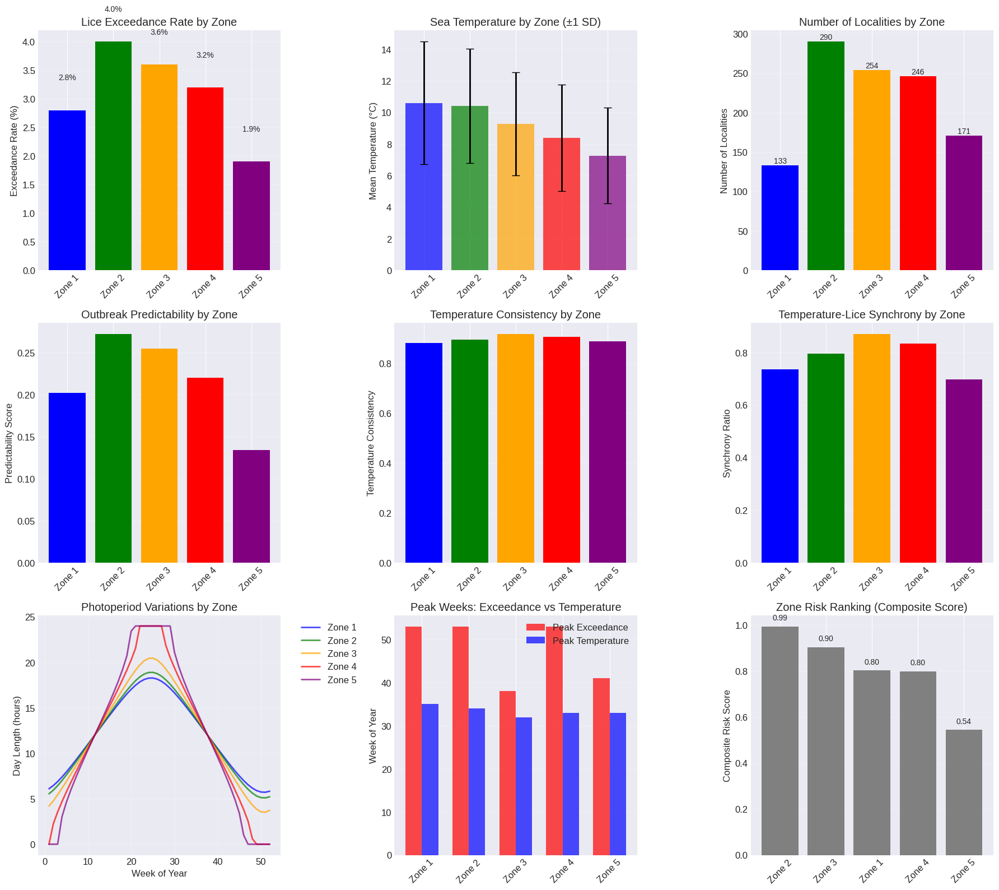


 ZONE ANALYSIS SUMMARY REPORT

 Zone Statistics:
----------------------------------------

1. Basic Statistics:
                           Sea_Temperature                      \
                                      mean   std   min     max   
Zone                                                             
Zone 1: Southern (58-60°N)           10.59  3.89  0.14   52.50   
Zone 2: Western (60-63°N)            10.40  3.62  0.00  196.18   
Zone 3: Mid (63-66°N)                 9.28  3.26  0.00   96.00   
Zone 4: Northern (66-69°N)            8.38  3.38  0.00   98.00   
Zone 5: Arctic (69-71°N)              7.26  3.03  0.04  173.44   

                           Adult_Female_Lice              Exceedance  \
                                        mean    max   std       mean   
Zone                                                                   
Zone 1: Southern (58-60°N)              0.16   8.57  0.24       0.03   
Zone 2: Western (60-63°N)               0.18  13.20  0.31       0.04  

In [4]:
# ============================================
# STEP 4: LATITUDINAL ZONATION ANALYSIS
# ============================================

print("\n" + "="*60)
print("STEP 4: Latitudinal Zonation Analysis")
print("="*60)

print(" Zone distribution:")
zone_counts = df['Zone'].value_counts()
for zone, count in zone_counts.items():
    print(f"   {zone}: {count:,} records")
    
print("\n Analyzing zone differences...")

def analyze_zone_differences(df, recurrence_df, temp_df, synchrony_df):
    """Comprehensive analysis of differences between latitudinal zones"""
    
    zone_analysis = {}
    
    basic_stats = df.groupby('Zone').agg({
        'Sea_Temperature': ['mean', 'std', 'min', 'max'],
        'Adult_Female_Lice': ['mean', 'max', 'std'],
        'Exceedance': 'mean',
        'Locality_Number': 'nunique'
    }).round(3)
    
    zone_analysis['basic_stats'] = basic_stats
    
    if 'Zone' in recurrence_df.columns:
        recurrence_stats = recurrence_df.groupby('Zone').agg({
            'Predictability_Score': ['mean', 'std', 'count'],
            'Recurrent_Weeks': 'mean',
            'Total_Exceedances': 'sum'
        }).round(3)
        zone_analysis['recurrence_stats'] = recurrence_stats
    
    if 'Zone' in temp_df.columns:
        temp_stats = temp_df.groupby('Zone').agg({
            'Mean_Temperature': 'mean',
            'Temp_Consistency': 'mean',
            'Temp_Trend': lambda x: np.mean(x) * 10,  # °C per decade
            'Trend_Significant': 'sum'
        }).round(3)
        zone_analysis['temperature_stats'] = temp_stats
    
    if 'Zone' in synchrony_df.columns:
        sync_stats = synchrony_df.groupby('Zone').agg({
            'Synchrony_Ratio': ['mean', 'count'],
            'Synchronized_Weeks': 'mean',
            'Synchrony_Score': 'mean'
        }).round(3)
        zone_analysis['synchrony_stats'] = sync_stats
    
    seasonal_patterns = {}
    for zone in df['Zone'].unique():
        zone_data = df[df['Zone'] == zone]
        
        weekly_pattern = zone_data.groupby('Week').agg({
            'Exceedance': 'mean',
            'Sea_Temperature': 'mean'
        }).reset_index()
        
        if len(weekly_pattern) > 0:
            peak_exceedance_week = weekly_pattern.loc[weekly_pattern['Exceedance'].idxmax(), 'Week']
            peak_temperature_week = weekly_pattern.loc[weekly_pattern['Sea_Temperature'].idxmax(), 'Week']
        else:
            peak_exceedance_week = None
            peak_temperature_week = None
        
        seasonal_patterns[zone] = {
            'weekly_pattern': weekly_pattern,
            'peak_exceedance_week': peak_exceedance_week,
            'peak_temperature_week': peak_temperature_week,
            'exceedance_season_length': len(weekly_pattern[weekly_pattern['Exceedance'] > weekly_pattern['Exceedance'].mean()])
        }
    
    zone_analysis['seasonal_patterns'] = seasonal_patterns
    
    photoperiod_data = {}
    for zone in df['Zone'].unique():
        zone_data = df[df['Zone'] == zone]
        if len(zone_data) == 0:
            continue
            
        mean_lat = zone_data['Latitude'].mean()
        
        day_lengths = {}
        for week in range(1, 53):
            day_of_year = week * 7
            declination = 23.45 * np.sin(np.radians(360/365 * (day_of_year - 81)))
            lat_rad = np.radians(mean_lat)
            dec_rad = np.radians(declination)
            
            cos_term = -np.tan(lat_rad) * np.tan(dec_rad)
            cos_term = np.clip(cos_term, -1, 1)
            
            hour_angle = np.arccos(cos_term)
            daylight_hours = 2 * hour_angle * 24 / (2 * np.pi)
            
            day_lengths[week] = daylight_hours
        
        photoperiod_data[zone] = {
            'mean_latitude': mean_lat,
            'day_lengths': day_lengths,
            'max_day_length': max(day_lengths.values()),
            'min_day_length': min(day_lengths.values()),
            'annual_variation': max(day_lengths.values()) - min(day_lengths.values())
        }
    
    zone_analysis['photoperiod'] = photoperiod_data
    
    rankings = {}
    exceedance_ranking = basic_stats[('Exceedance', 'mean')].sort_values(ascending=False)
    rankings['exceedance_rate'] = exceedance_ranking
    
    if 'Mean_Temperature' in temp_stats.columns:
        temp_ranking = temp_stats['Mean_Temperature'].sort_values(ascending=False)
        rankings['temperature'] = temp_ranking
    
    if 'Predictability_Score' in zone_analysis.get('recurrence_stats', pd.DataFrame()).columns:
        predictability_ranking = recurrence_stats[('Predictability_Score', 'mean')].sort_values(ascending=False)
        rankings['predictability'] = predictability_ranking
    
    if 'Synchrony_Ratio' in zone_analysis.get('synchrony_stats', pd.DataFrame()).columns:
        synchrony_ranking = sync_stats[('Synchrony_Ratio', 'mean')].sort_values(ascending=False)
        rankings['synchrony'] = synchrony_ranking
    
    zone_analysis['rankings'] = rankings
    
    return zone_analysis
zone_analysis = analyze_zone_differences(df, recurrence_df, temp_df, synchrony_df)

print(" Zone analysis completed")

print("\n Creating zone visualization map...")

zone_map = folium.Map(location=[65, 12], zoom_start=5, tiles='CartoDB positron')

zone_colors = {
    'Zone 1: Southern (58-60°N)': 'blue',
    'Zone 2: Western (60-63°N)': 'green',
    'Zone 3: Mid (63-66°N)': 'orange',
    'Zone 4: Northern (66-69°N)': 'red',
    'Zone 5: Arctic (69-71°N)': 'purple'
}

for _, row in df[['Locality_Number', 'Locality_Name', 'Latitude', 'Longitude', 'Zone']].drop_duplicates().iterrows():
    zone = row['Zone']
    color = zone_colors.get(zone, 'gray')
    
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=4,
        popup=folium.Popup(f"""
        <b>{row['Locality_Name']}</b><br>
        Zone: {zone}<br>
        Lat: {row['Latitude']:.3f}°N<br>
        Lon: {row['Longitude']:.3f}°E
        """, max_width=300),
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.5,
        tooltip=f"{row['Locality_Name']} - {zone}"
    ).add_to(zone_map)
    
zone_boundaries = {
    'Zone 1: Southern (58-60°N)': [[58, 5], [58, 10], [60, 10], [60, 5], [58, 5]],
    'Zone 2: Western (60-63°N)': [[60, 5], [60, 10], [63, 10], [63, 5], [60, 5]],
    'Zone 3: Mid (63-66°N)': [[63, 5], [63, 10], [66, 10], [66, 5], [63, 5]],
    'Zone 4: Northern (66-69°N)': [[66, 5], [66, 10], [69, 10], [69, 5], [66, 5]],
    'Zone 5: Arctic (69-71°N)': [[69, 5], [69, 10], [71, 10], [71, 5], [69, 5]]
}

for zone, coordinates in zone_boundaries.items():
    color = zone_colors.get(zone, 'gray')
    
    folium.Polygon(
        locations=coordinates,
        color=color,
        weight=2,
        fill=True,
        fill_color=color,
        fill_opacity=0.1,
        popup=zone,
        tooltip=zone
    ).add_to(zone_map)

zone_labels = {
    'Zone 1: Southern (58-60°N)': [59, 7.5],
    'Zone 2: Western (60-63°N)': [61.5, 7.5],
    'Zone 3: Mid (63-66°N)': [64.5, 7.5],
    'Zone 4: Northern (66-69°N)': [67.5, 7.5],
    'Zone 5: Arctic (69-71°N)': [70, 7.5]
}

for zone, coords in zone_labels.items():
    folium.Marker(
        location=coords,
        icon=folium.DivIcon(
            html=f'<div style="font-size: 14pt; font-weight: bold; color: {zone_colors.get(zone, "black")};">{zone.split(":")[0]}</div>'
        ),
        tooltip=zone
    ).add_to(zone_map)

zone_legend = '''
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 220px; height: 200px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white;
     padding: 10px;">
     <b>Latitudinal Zones</b><br>
     <i class="fa fa-square" style="color:blue"></i> Zone 1: Southern (58-60°N)<br>
     <i class="fa fa-square" style="color:green"></i> Zone 2: Western (60-63°N)<br>
     <i class="fa fa-square" style="color:orange"></i> Zone 3: Mid (63-66°N)<br>
     <i class="fa fa-square" style="color:red"></i> Zone 4: Northern (66-69°N)<br>
     <i class="fa fa-square" style="color:purple"></i> Zone 5: Arctic (69-71°N)<br>
     <br><b>Characteristics:</b><br>
     • Color indicates zone<br>
     • Opacity shows density<br>
     • Zones approximate
</div>
'''
zone_map.get_root().html.add_child(folium.Element(zone_legend))

print(" Zone map created. Displaying...")
display(zone_map)

print("\n Creating zone comparison plots...")

fig, axes = plt.subplots(3, 3, figsize=(18, 16))

basic_stats = zone_analysis['basic_stats']

exceedance_rates = basic_stats[('Exceedance', 'mean')] * 100
bars1 = axes[0,0].bar(range(len(exceedance_rates)), exceedance_rates.values, 
                      color=[zone_colors.get(zone, 'gray') for zone in exceedance_rates.index])
axes[0,0].set_xticks(range(len(exceedance_rates)))
axes[0,0].set_xticklabels([z.split(':')[0] for z in exceedance_rates.index], rotation=45)
axes[0,0].set_ylabel('Exceedance Rate (%)')
axes[0,0].set_title('Lice Exceedance Rate by Zone')
axes[0,0].grid(True, alpha=0.3, axis='y')

for i, (zone, rate) in enumerate(exceedance_rates.items()):
    axes[0,0].text(i, rate + 0.5, f'{rate:.1f}%', ha='center', va='bottom', fontsize=10)

if ('Sea_Temperature', 'mean') in basic_stats.columns:
    mean_temps = basic_stats[('Sea_Temperature', 'mean')]
    temp_std = basic_stats[('Sea_Temperature', 'std')]
    
    bars2 = axes[0,1].bar(range(len(mean_temps)), mean_temps.values,
                         yerr=temp_std.values,
                         color=[zone_colors.get(zone, 'gray') for zone in mean_temps.index],
                         capsize=5, alpha=0.7, error_kw={'elinewidth': 2})
    axes[0,1].set_xticks(range(len(mean_temps)))
    axes[0,1].set_xticklabels([z.split(':')[0] for z in mean_temps.index], rotation=45)
    axes[0,1].set_ylabel('Mean Temperature (°C)')
    axes[0,1].set_title('Sea Temperature by Zone (±1 SD)')
    axes[0,1].grid(True, alpha=0.3, axis='y')

locality_counts = basic_stats[('Locality_Number', 'nunique')]
bars3 = axes[0,2].bar(range(len(locality_counts)), locality_counts.values,
                     color=[zone_colors.get(zone, 'gray') for zone in locality_counts.index])
axes[0,2].set_xticks(range(len(locality_counts)))
axes[0,2].set_xticklabels([z.split(':')[0] for z in locality_counts.index], rotation=45)
axes[0,2].set_ylabel('Number of Localities')
axes[0,2].set_title('Number of Localities by Zone')
axes[0,2].grid(True, alpha=0.3, axis='y')

for i, count in enumerate(locality_counts.values):
    axes[0,2].text(i, count + 0.5, str(int(count)), ha='center', va='bottom', fontsize=10)

if 'recurrence_stats' in zone_analysis:
    recur_stats = zone_analysis['recurrence_stats']
    if ('Predictability_Score', 'mean') in recur_stats.columns:
        predictability = recur_stats[('Predictability_Score', 'mean')]
        bars4 = axes[1,0].bar(range(len(predictability)), predictability.values,
                            color=[zone_colors.get(zone, 'gray') for zone in predictability.index])
        axes[1,0].set_xticks(range(len(predictability)))
        axes[1,0].set_xticklabels([z.split(':')[0] for z in predictability.index], rotation=45)
        axes[1,0].set_ylabel('Predictability Score')
        axes[1,0].set_title('Outbreak Predictability by Zone')
        axes[1,0].grid(True, alpha=0.3, axis='y')

if 'temperature_stats' in zone_analysis:
    temp_stats = zone_analysis['temperature_stats']
    if 'Temp_Consistency' in temp_stats.columns:
        temp_consistency = temp_stats['Temp_Consistency']
        bars5 = axes[1,1].bar(range(len(temp_consistency)), temp_consistency.values,
                            color=[zone_colors.get(zone, 'gray') for zone in temp_consistency.index])
        axes[1,1].set_xticks(range(len(temp_consistency)))
        axes[1,1].set_xticklabels([z.split(':')[0] for z in temp_consistency.index], rotation=45)
        axes[1,1].set_ylabel('Temperature Consistency')
        axes[1,1].set_title('Temperature Consistency by Zone')
        axes[1,1].grid(True, alpha=0.3, axis='y')

if 'synchrony_stats' in zone_analysis:
    sync_stats = zone_analysis['synchrony_stats']
    if ('Synchrony_Ratio', 'mean') in sync_stats.columns:
        synchrony = sync_stats[('Synchrony_Ratio', 'mean')]
        bars6 = axes[1,2].bar(range(len(synchrony)), synchrony.values,
                            color=[zone_colors.get(zone, 'gray') for zone in synchrony.index])
        axes[1,2].set_xticks(range(len(synchrony)))
        axes[1,2].set_xticklabels([z.split(':')[0] for z in synchrony.index], rotation=45)
        axes[1,2].set_ylabel('Synchrony Ratio')
        axes[1,2].set_title('Temperature-Lice Synchrony by Zone')
        axes[1,2].grid(True, alpha=0.3, axis='y')

if 'photoperiod' in zone_analysis:
    photoperiod_data = zone_analysis['photoperiod']
    
    weeks = list(range(1, 53))
    for zone, data in photoperiod_data.items():
        day_lengths = [data['day_lengths'][week] for week in weeks]
        color = zone_colors.get(zone, 'gray')
        zone_label = zone.split(':')[0]
        
        axes[2,0].plot(weeks, day_lengths, label=zone_label, color=color, linewidth=2, alpha=0.7)
    
    axes[2,0].set_xlabel('Week of Year')
    axes[2,0].set_ylabel('Day Length (hours)')
    axes[2,0].set_title('Photoperiod Variations by Zone')
    axes[2,0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[2,0].grid(True, alpha=0.3)

if 'seasonal_patterns' in zone_analysis:
    seasonal_data = zone_analysis['seasonal_patterns']
    
    zones = []
    peak_exceedance_weeks = []
    peak_temp_weeks = []
    
    for zone, data in seasonal_data.items():
        if data['peak_exceedance_week'] and data['peak_temperature_week']:
            zones.append(zone.split(':')[0])
            peak_exceedance_weeks.append(data['peak_exceedance_week'])
            peak_temp_weeks.append(data['peak_temperature_week'])
    
    if zones:
        x = np.arange(len(zones))
        width = 0.35
        
        bars8a = axes[2,1].bar(x - width/2, peak_exceedance_weeks, width,
                              label='Peak Exceedance', color='red', alpha=0.7)
        bars8b = axes[2,1].bar(x + width/2, peak_temp_weeks, width,
                              label='Peak Temperature', color='blue', alpha=0.7)
        
        axes[2,1].set_xticks(x)
        axes[2,1].set_xticklabels(zones, rotation=45)
        axes[2,1].set_ylabel('Week of Year')
        axes[2,1].set_title('Peak Weeks: Exceedance vs Temperature')
        axes[2,1].legend()
        axes[2,1].grid(True, alpha=0.3, axis='y')

if 'rankings' in zone_analysis:
    rankings = zone_analysis['rankings']
    
    composite_scores = {}
    for zone in exceedance_rates.index:
        zone_short = zone.split(':')[0]
        
        exceedance_score = exceedance_rates[zone] / exceedance_rates.max()
        
        if 'predictability' in rankings:
            predict_score = rankings['predictability'].get(zone, 0) / rankings['predictability'].max()
        else:
            predict_score = 0
            
        if 'temperature' in rankings:
            temp_score = rankings['temperature'].get(zone, 0) / rankings['temperature'].max()
        else:
            temp_score = 0
        
        composite = 0.4 * exceedance_score + 0.3 * predict_score + 0.3 * temp_score
        composite_scores[zone_short] = composite
    
    zones_sorted = sorted(composite_scores.items(), key=lambda x: x[1], reverse=True)
    zone_names = [z[0] for z in zones_sorted]
    scores = [z[1] for z in zones_sorted]
    
    bars9 = axes[2,2].bar(range(len(scores)), scores,
                         color=[zone_colors.get(f'{zone}:', 'gray') for zone in zone_names])
    axes[2,2].set_xticks(range(len(scores)))
    axes[2,2].set_xticklabels(zone_names, rotation=45)
    axes[2,2].set_ylabel('Composite Risk Score')
    axes[2,2].set_title('Zone Risk Ranking (Composite Score)')
    axes[2,2].grid(True, alpha=0.3, axis='y')
    
    for i, score in enumerate(scores):
        axes[2,2].text(i, score + 0.02, f'{score:.2f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

print("\n ZONE ANALYSIS SUMMARY REPORT")
print("="*60)

print("\n Zone Statistics:")
print("-"*40)


print("\n1. Basic Statistics:")
print(basic_stats.round(2))

print("\n2. Zone Rankings:")
print("-"*20)

if 'rankings' in zone_analysis:
    rankings = zone_analysis['rankings']
    
    print("\nExceedance Rate (Highest to Lowest):")
    for i, (zone, rate) in enumerate(rankings.get('exceedance_rate', pd.Series()).items(), 1):
        zone_short = zone.split(':')[0]
        print(f"   {i}. {zone_short}: {rate*100:.1f}%")
    
    if 'temperature' in rankings:
        print("\nMean Temperature (Warmest to Coldest):")
        for i, (zone, temp) in enumerate(rankings['temperature'].items(), 1):
            zone_short = zone.split(':')[0]
            print(f"   {i}. {zone_short}: {temp:.1f}°C")
    
    if 'predictability' in rankings:
        print("\nPredictability (Most to Least Predictable):")
        for i, (zone, score) in enumerate(rankings['predictability'].items(), 1):
            zone_short = zone.split(':')[0]
            print(f"   {i}. {zone_short}: {score:.2f}")

print("\n3. Photoperiod Analysis:")
print("-"*20)
if 'photoperiod' in zone_analysis:
    photoperiod_data = zone_analysis['photoperiod']
    
    for zone, data in photoperiod_data.items():
        zone_short = zone.split(':')[0]
        print(f"\n{zone_short}:")
        print(f"   Mean Latitude: {data['mean_latitude']:.1f}°N")
        print(f"   Maximum Day Length: {data['max_day_length']:.1f} hours")
        print(f"   Minimum Day Length: {data['min_day_length']:.1f} hours")
        print(f"   Annual Variation: {data['annual_variation']:.1f} hours")

print("\n4. Seasonal Patterns:")
print("-"*20)
if 'seasonal_patterns' in zone_analysis:
    seasonal_data = zone_analysis['seasonal_patterns']
    
    for zone, data in seasonal_data.items():
        zone_short = zone.split(':')[0]
        if data['peak_exceedance_week']:
            print(f"\n{zone_short}:")
            print(f"   Peak Exceedance Week: {data['peak_exceedance_week']}")
            print(f"   Peak Temperature Week: {data['peak_temperature_week']}")
            print(f"   Exceedance Season Length: {data['exceedance_season_length']} weeks")

print("\n5. Key Zone Findings:")
print("-"*20)

highest_exceedance = basic_stats[('Exceedance', 'mean')].idxmax()
lowest_exceedance = basic_stats[('Exceedance', 'mean')].idxmin()

highest_temp = basic_stats[('Sea_Temperature', 'mean')].idxmax()
lowest_temp = basic_stats[('Sea_Temperature', 'mean')].idxmin()

print(f"\n• Highest exceedance rate: {highest_exceedance.split(':')[0]} ({basic_stats.loc[highest_exceedance, ('Exceedance', 'mean')]*100:.1f}%)")
print(f"• Lowest exceedance rate: {lowest_exceedance.split(':')[0]} ({basic_stats.loc[lowest_exceedance, ('Exceedance', 'mean')]*100:.1f}%)")
print(f"• Warmest zone: {highest_temp.split(':')[0]} ({basic_stats.loc[highest_temp, ('Sea_Temperature', 'mean')]:.1f}°C)")
print(f"• Coldest zone: {lowest_temp.split(':')[0]} ({basic_stats.loc[lowest_temp, ('Sea_Temperature', 'mean')]:.1f}°C)")

if 'recurrence_stats' in zone_analysis:
    highest_predict = zone_analysis['recurrence_stats'][('Predictability_Score', 'mean')].idxmax()
    print(f"• Most predictable: {highest_predict.split(':')[0]} ({zone_analysis['recurrence_stats'].loc[highest_predict, ('Predictability_Score', 'mean')]:.2f})")

print("\n6. Management Implications:")
print("-"*20)
print("""
• Zone 1 (Southern): Highest temperatures, monitor year-round
• Zone 2 (Western): Moderate conditions, focus on seasonal peaks
• Zone 3 (Mid): Transition zone, adapt strategies seasonally
• Zone 4 (Northern): Colder, shorter season, pre-emptive treatments
• Zone 5 (Arctic): Most extreme, limited monitoring windows
""")

print("\n" + "="*60)
print("STEP 4 COMPLETE: Latitudinal zonation analyzed")
print("="*60)

zone_map.save('/kaggle/working/zone_analysis_map.html')
print(" Zone map saved: /kaggle/working/zone_analysis_map.html")


STEP 5: Environmental Drivers & Vulnerability Modeling

 Analyzing environmental drivers by zone...
   Analyzing temperature optima...

 Creating environmental driver visualizations...


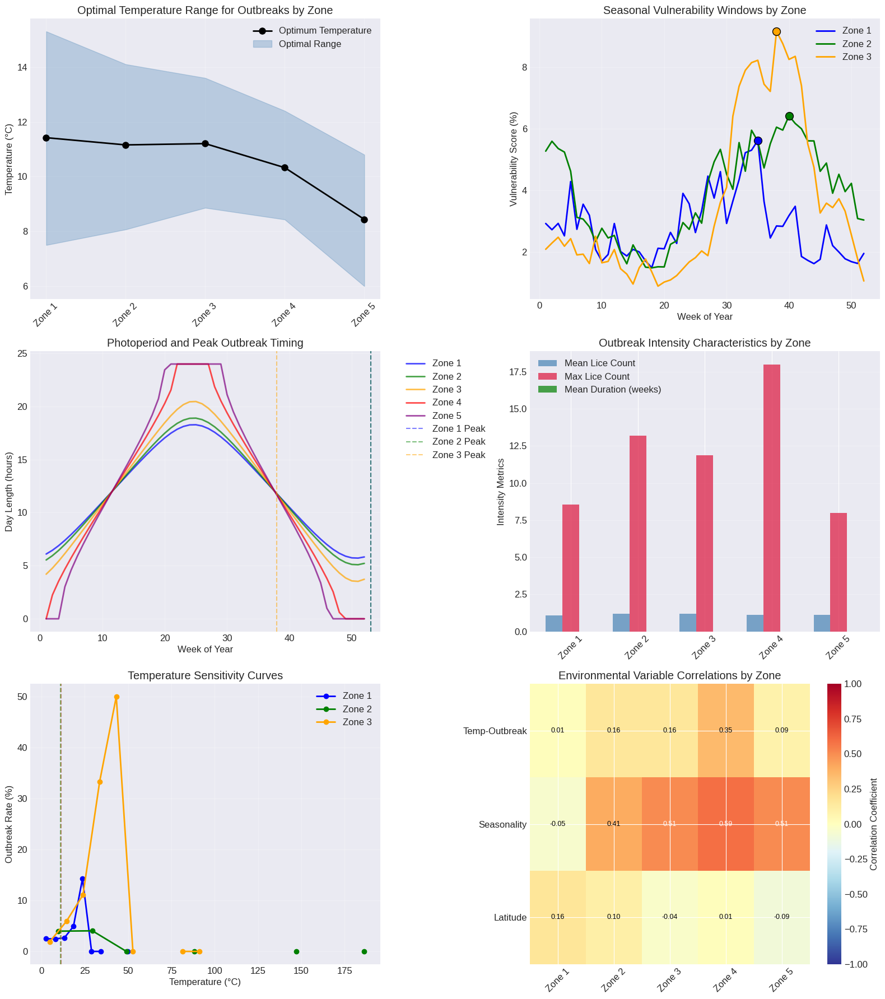

In [5]:
# ============================================
# STEP 5: ENVIRONMENTAL DRIVERS & VULNERABILITY MODELING
# ============================================

print("\n" + "="*60)
print("STEP 5: Environmental Drivers & Vulnerability Modeling")
print("="*60)

print("\n Analyzing environmental drivers by zone...")

def analyze_environmental_drivers(df, zone_analysis):
    """
    Analyze temperature, photoperiod, and other environmental drivers
    that influence lice outbreaks in each latitudinal zone.
    """
    
    zone_drivers = {}
    
    print("   Analyzing temperature optima...")
    for zone in df['Zone'].unique():
        zone_data = df[df['Zone'] == zone]
        
        if len(zone_data) == 0:
            continue
        
        outbreak_temps = zone_data[zone_data['Exceedance'] == 1]['Sea_Temperature']
        non_outbreak_temps = zone_data[zone_data['Exceedance'] == 0]['Sea_Temperature']
        
        if len(outbreak_temps) > 0:
            optimal_min = outbreak_temps.quantile(0.25)
            optimal_max = outbreak_temps.quantile(0.75)
            optimal_mean = outbreak_temps.mean()
        else:
            optimal_min = optimal_max = optimal_mean = np.nan
        
        temp_bins = pd.cut(zone_data['Sea_Temperature'], bins=10)
        temp_sensitivity = zone_data.groupby(temp_bins)['Exceedance'].mean()
        
        if 'photoperiod' in zone_analysis and zone in zone_analysis['photoperiod']:
            photoperiod_data = zone_analysis['photoperiod'][zone]
        else:
            photoperiod_data = {}
        
        seasonal_vulnerability = {}
        for week in range(1, 53):
            week_data = zone_data[zone_data['Week'] == week]
            if len(week_data) > 0:
                vulnerability_score = week_data['Exceedance'].mean() * 100
                seasonal_vulnerability[week] = vulnerability_score
        
        zone_drivers[zone] = {
            'temperature_optima': {
                'mean': optimal_mean,
                'range': (optimal_min, optimal_max),
                'sensitivity_curve': temp_sensitivity
            },
            'photoperiod': photoperiod_data,
            'seasonal_vulnerability': seasonal_vulnerability,
            'outbreak_intensity': {
                'mean_lice': zone_data[zone_data['Exceedance'] == 1]['Adult_Female_Lice'].mean(),
                'max_lice': zone_data[zone_data['Exceedance'] == 1]['Adult_Female_Lice'].max(),
                'outbreak_duration': zone_data.groupby(['Year', 'Locality_Number'])['Exceedance']
                                        .apply(lambda x: x.rolling(4).sum().max())
                                        .mean()  # Mean consecutive outbreak weeks
            },
            'environmental_interaction': {
                'temp_photoperiod_correlation': zone_data.groupby('Week').agg({
                    'Sea_Temperature': 'mean',
                    'Exceedance': 'mean'
                }).corr().iloc[0, 1] if len(zone_data) > 10 else np.nan
            }
        }
    
    return zone_drivers
    
zone_drivers = analyze_environmental_drivers(df, zone_analysis)

print("\n Creating environmental driver visualizations...")

fig, axes = plt.subplots(3, 2, figsize=(16, 18))

temp_opts = []
zone_labels = []
zone_colors_list = []
zone_colors_dict = {
    'Zone 1: Southern (58-60°N)': 'blue',
    'Zone 2: Western (60-63°N)': 'green',
    'Zone 3: Mid (63-66°N)': 'orange',
    'Zone 4: Northern (66-69°N)': 'red',
    'Zone 5: Arctic (69-71°N)': 'purple'
}

for zone, data in zone_drivers.items():
    if 'temperature_optima' in data and 'range' in data['temperature_optima']:
        opt_range = data['temperature_optima']['range']
        if not any(np.isnan(opt_range)):
            temp_opts.append({
                'zone': zone.split(':')[0],
                'optimum': data['temperature_optima']['mean'],
                'min': opt_range[0],
                'max': opt_range[1]
            })
            zone_labels.append(zone.split(':')[0])
            zone_colors_list.append(zone_colors_dict.get(zone, 'gray'))

if temp_opts:
    df_temp_opts = pd.DataFrame(temp_opts)
    x = range(len(df_temp_opts))

    axes[0,0].plot(x, df_temp_opts['optimum'], 'k-', linewidth=2, marker='o', 
                   markersize=8, label='Optimum Temperature')
    
    axes[0,0].fill_between(x, df_temp_opts['min'], df_temp_opts['max'], 
                          alpha=0.3, color='steelblue', label='Optimal Range')
    
    axes[0,0].set_xticks(x)
    axes[0,0].set_xticklabels(df_temp_opts['zone'], rotation=45)
    axes[0,0].set_ylabel('Temperature (°C)')
    axes[0,0].set_title('Optimal Temperature Range for Outbreaks by Zone')
    axes[0,0].legend()
    axes[0,0].grid(True, alpha=0.3)

zones_to_plot = list(zone_drivers.keys())[:3]  # Plot first 3 zones
for zone in zones_to_plot:
    if 'seasonal_vulnerability' in zone_drivers[zone]:
        vuln_data = zone_drivers[zone]['seasonal_vulnerability']
        weeks = list(vuln_data.keys())
        scores = list(vuln_data.values())
        
        zone_label = zone.split(':')[0]
        color = zone_colors_dict.get(zone, 'gray')
        
        axes[0,1].plot(weeks, scores, label=zone_label, color=color, linewidth=2)
        
        if scores:
            peak_week = weeks[np.argmax(scores)]
            peak_score = max(scores)
            axes[0,1].scatter([peak_week], [peak_score], color=color, s=100, 
                            edgecolor='black', zorder=5)

axes[0,1].set_xlabel('Week of Year')
axes[0,1].set_ylabel('Vulnerability Score (%)')
axes[0,1].set_title('Seasonal Vulnerability Windows by Zone')
axes[0,1].legend()
axes[0,1].grid(True, alpha=0.3)

if 'photoperiod' in zone_analysis:
    for zone, data in zone_analysis['photoperiod'].items():
        zone_label = zone.split(':')[0]
        color = zone_colors_dict.get(zone, 'gray')
        
        weeks = list(range(1, 53))
        day_lengths = [data['day_lengths'].get(w, 0) for w in weeks]
        
        axes[1,0].plot(weeks, day_lengths, label=zone_label, color=color, 
                      linewidth=2, alpha=0.7)

for zone in zones_to_plot:
    if zone in zone_analysis.get('seasonal_patterns', {}):
        peak_week = zone_analysis['seasonal_patterns'][zone].get('peak_exceedance_week')
        if peak_week:
            zone_label = zone.split(':')[0]
            color = zone_colors_dict.get(zone, 'gray')
            axes[1,0].axvline(x=peak_week, color=color, linestyle='--', 
                            alpha=0.5, label=f'{zone_label} Peak')

axes[1,0].set_xlabel('Week of Year')
axes[1,0].set_ylabel('Day Length (hours)')
axes[1,0].set_title('Photoperiod and Peak Outbreak Timing')
axes[1,0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1,0].grid(True, alpha=0.3)

intensity_data = []
for zone, data in zone_drivers.items():
    if 'outbreak_intensity' in data:
        intensity = data['outbreak_intensity']
        intensity_data.append({
            'zone': zone.split(':')[0],
            'mean_lice': intensity.get('mean_lice', 0),
            'max_lice': intensity.get('max_lice', 0),
            'duration': intensity.get('duration', 0)
        })

if intensity_data:
    df_intensity = pd.DataFrame(intensity_data)
    x = np.arange(len(df_intensity))
    width = 0.25
    
    bars1 = axes[1,1].bar(x - width, df_intensity['mean_lice'], width, 
                         label='Mean Lice Count', color='steelblue', alpha=0.7)
    bars2 = axes[1,1].bar(x, df_intensity['max_lice'], width,
                         label='Max Lice Count', color='crimson', alpha=0.7)
    bars3 = axes[1,1].bar(x + width, df_intensity['duration'], width,
                         label='Mean Duration (weeks)', color='green', alpha=0.7)
    
    axes[1,1].set_xticks(x)
    axes[1,1].set_xticklabels(df_intensity['zone'], rotation=45)
    axes[1,1].set_ylabel('Intensity Metrics')
    axes[1,1].set_title('Outbreak Intensity Characteristics by Zone')
    axes[1,1].legend()
    axes[1,1].grid(True, alpha=0.3, axis='y')

for zone in zones_to_plot:
    if zone in zone_drivers and 'temperature_optima' in zone_drivers[zone]:
        sensitivity = zone_drivers[zone]['temperature_optima'].get('sensitivity_curve')
        if sensitivity is not None and len(sensitivity) > 0:
            zone_label = zone.split(':')[0]
            color = zone_colors_dict.get(zone, 'gray')
            
        
            temp_midpoints = [interval.mid for interval in sensitivity.index]
            outbreak_rates = sensitivity.values * 100
            
            axes[2,0].plot(temp_midpoints, outbreak_rates, 'o-', 
                          label=zone_label, color=color, linewidth=2)
            
            opt_temp = zone_drivers[zone]['temperature_optima'].get('mean')
            if not np.isnan(opt_temp):
                axes[2,0].axvline(x=opt_temp, color=color, linestyle='--', alpha=0.5)

axes[2,0].set_xlabel('Temperature (°C)')
axes[2,0].set_ylabel('Outbreak Rate (%)')
axes[2,0].set_title('Temperature Sensitivity Curves')
axes[2,0].legend()
axes[2,0].grid(True, alpha=0.3)

interaction_matrix = []
for zone in df['Zone'].unique():
    zone_data = df[df['Zone'] == zone]
    
    if len(zone_data) > 10:
        correlations = {}
        
        temp_exceed_corr = zone_data.groupby(['Year', 'Week']).agg({
            'Sea_Temperature': 'mean',
            'Exceedance': 'max'
        }).corr().iloc[0, 1]
        correlations['Temp-Outbreak'] = temp_exceed_corr
        
        week_exceed_corr = zone_data.groupby('Week')['Exceedance'].mean().corr(
            pd.Series(range(1, 53), index=range(1, 53))
        )
        correlations['Seasonality'] = week_exceed_corr
        
        if zone_data['Latitude'].nunique() > 1:
            lat_exceed_corr = zone_data.groupby('Latitude')['Exceedance'].mean().corr(
                zone_data.groupby('Latitude')['Latitude'].mean()
            )
            correlations['Latitude'] = lat_exceed_corr
        
        interaction_matrix.append({
            'zone': zone.split(':')[0],
            **correlations
        })

if interaction_matrix:
    df_interaction = pd.DataFrame(interaction_matrix).set_index('zone')

    im = axes[2,1].imshow(df_interaction.T, cmap='RdYlBu_r', aspect='auto',
                         vmin=-1, vmax=1)
    
    axes[2,1].set_xticks(range(len(df_interaction)))
    axes[2,1].set_xticklabels(df_interaction.index, rotation=45)
    axes[2,1].set_yticks(range(len(df_interaction.columns)))
    axes[2,1].set_yticklabels(df_interaction.columns)
    
    axes[2,1].set_title('Environmental Variable Correlations by Zone')
    
    for i in range(len(df_interaction)):
        for j in range(len(df_interaction.columns)):
            value = df_interaction.iloc[i, j]
            if not np.isnan(value):
                axes[2,1].text(i, j, f'{value:.2f}', ha='center', va='center',
                             color='black' if abs(value) < 0.5 else 'white',
                             fontsize=9)
    
    plt.colorbar(im, ax=axes[2,1], label='Correlation Coefficient')

plt.tight_layout()
plt.show()

In [6]:
# ============================================
# STEP 6: VULNERABILITY MODELING
# ============================================

print("\n Building vulnerability model:")

def build_vulnerability_model(df, zone_drivers):
    """
    Build machine learning model to predict outbreak vulnerability.
    """
    
    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import StandardScaler
    from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
    from sklearn.metrics import roc_auc_score
    import xgboost as xgb
    
    print(" Preparing data for vulnerability modeling: ")
    features_df = pd.DataFrame()
    
    locality_features = df.groupby(['Locality_Number', 'Year', 'Week']).agg({
        'Latitude': 'first',
        'Longitude': 'first',
        'Zone': 'first',
        'Sea_Temperature': 'mean',
        'Adult_Female_Lice': 'mean',
        'Exceedance': 'max'
    }).reset_index()
    
    locality_features['Week_Sin'] = np.sin(2 * np.pi * locality_features['Week'] / 52)
    locality_features['Week_Cos'] = np.cos(2 * np.pi * locality_features['Week'] / 52)
    
    locality_features['Photoperiod_Est'] = locality_features.apply(
        lambda row: calculate_day_length(row['Latitude'], row['Week']), axis=1
    )
    
    locality_features = locality_features.sort_values(['Locality_Number', 'Year', 'Week'])
    
    for loc in locality_features['Locality_Number'].unique():
        loc_mask = locality_features['Locality_Number'] == loc
        locality_features.loc[loc_mask, 'Temp_Rolling_Mean'] = (
            locality_features.loc[loc_mask, 'Sea_Temperature'].rolling(4).mean()
        )
        locality_features.loc[loc_mask, 'Lice_Rolling_Mean'] = (
            locality_features.loc[loc_mask, 'Adult_Female_Lice'].rolling(4).mean()
        )
    
    zone_driver_features = []
    for _, row in locality_features.iterrows():
        zone = row['Zone']
        if zone in zone_drivers:
            drivers = zone_drivers[zone]
            
            opt_temp = drivers['temperature_optima'].get('mean', np.nan)
            temp_proximity = abs(row['Sea_Temperature'] - opt_temp) if not np.isnan(opt_temp) else np.nan
            
            vuln_scores = drivers.get('seasonal_vulnerability', {})
            season_vulnerability = vuln_scores.get(row['Week'], 0)
            
            zone_driver_features.append({
                'Temp_Optimum_Proximity': temp_proximity,
                'Season_Vulnerability': season_vulnerability,
                'Zone_Outbreak_Intensity': drivers.get('outbreak_intensity', {}).get('mean_lice', 0)
            })
        else:
            zone_driver_features.append({
                'Temp_Optimum_Proximity': np.nan,
                'Season_Vulnerability': 0,
                'Zone_Outbreak_Intensity': 0
            })
    
    zone_driver_df = pd.DataFrame(zone_driver_features)
    locality_features = pd.concat([locality_features, zone_driver_df], axis=1)
    
    feature_columns = [
        'Latitude', 'Longitude',
        'Sea_Temperature', 'Photoperiod_Est',
        'Week_Sin', 'Week_Cos',
        'Temp_Rolling_Mean', 'Lice_Rolling_Mean',
        'Temp_Optimum_Proximity', 'Season_Vulnerability',
        'Zone_Outbreak_Intensity'
    ]
    
    feature_columns = [col for col in feature_columns if col in locality_features.columns]
    
    X = locality_features[feature_columns].fillna(method='ffill').fillna(0)
    y = locality_features['Exceedance']
    
    print(f"   Features: {len(feature_columns)}, Samples: {len(X)}, Outbreaks: {y.sum()}")
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    print("\n   Training models: ")
    
    models = {
        'Random Forest': RandomForestClassifier(
            n_estimators=50,
            max_depth=10,
            random_state=42,
            class_weight='balanced'
        ),
        'Gradient Boosting': GradientBoostingClassifier(
            n_estimators=50,
            learning_rate=0.1,
            max_depth=5,
            random_state=42
        ),
        'XGBoost': xgb.XGBClassifier(
            n_estimators=50,
            learning_rate=0.1,
            max_depth=5,
            random_state=42,
            eval_metric='logloss'
        )
    }
    
    results = {}
    
    for name, model in models.items():
        print(f"\n   Training {name}: ")
       
        model.fit(X_train_scaled, y_train)
        
        y_pred = model.predict(X_test_scaled)
        y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
        
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        auc = roc_auc_score(y_test, y_pred_proba)
        
        print(f"     Accuracy: {accuracy:.3f}")
        print(f"     Precision: {precision:.3f}")
        print(f"     Recall: {recall:.3f}")
        print(f"     F1-Score: {f1:.3f}")
        print(f"     AUC-ROC: {auc:.3f}")
        
        results[name] = {
            'model': model,
            'scaler': scaler,
            'features': feature_columns,
            'metrics': {
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'auc': auc
            },
            'predictions': {
                'y_pred': y_pred,
                'y_pred_proba': y_pred_proba,
                'y_test': y_test.values
            }
        }
   
    print("\n   Analyzing feature importance...")
    best_model = results['Random Forest']['model']
    
    feature_importance = pd.DataFrame({
        'feature': feature_columns,
        'importance': best_model.feature_importances_
    }).sort_values('importance', ascending=False)
    
    print("\n   Top 10 Feature Importances:")
    for i, row in feature_importance.head(10).iterrows():
        print(f"     {row['feature']}: {row['importance']:.3f}")
    
    results['feature_importance'] = feature_importance
  
    print("\n   Generating vulnerability scores: ")
   
    X_all_scaled = scaler.transform(X.fillna(0))
    vulnerability_scores = best_model.predict_proba(X_all_scaled)[:, 1]
    
    locality_features['Vulnerability_Score'] = vulnerability_scores
    locality_features['Risk_Level'] = pd.qcut(vulnerability_scores, 
                                            q=5, 
                                            labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
  
    locality_vulnerability = locality_features.groupby('Locality_Number').agg({
        'Latitude': 'first',
        'Longitude': 'first',
        'Zone': 'first',
        'Vulnerability_Score': 'mean',
        'Risk_Level': lambda x: x.mode()[0] if len(x.mode()) > 0 else 'Unknown',
        'Exceedance': 'mean'
    }).reset_index()
    
    results['locality_vulnerability'] = locality_vulnerability
    
    return results

def calculate_day_length(latitude, week):
    """Calculate approximate day length for given latitude and week."""
    day_of_year = week * 7
   
    declination = 23.45 * np.sin(np.radians(360/365 * (day_of_year - 81)))
    
    lat_rad = np.radians(latitude)
    dec_rad = np.radians(declination)
    
    cos_term = -np.tan(lat_rad) * np.tan(dec_rad)
    cos_term = np.clip(cos_term, -1, 1)
    
    hour_angle = np.arccos(cos_term)
    daylight_hours = 2 * hour_angle * 24 / (2 * np.pi)
    
    return daylight_hours

vulnerability_results = build_vulnerability_model(df, zone_drivers)

print("\n Creating vulnerability map:")

vuln_map = folium.Map(location=[65, 12], zoom_start=5, tiles='CartoDB positron')

if 'locality_vulnerability' in vulnerability_results:
    vuln_df = vulnerability_results['locality_vulnerability']
    
    risk_colors = {
        'Very Low': 'green',
        'Low': 'lightgreen',
        'Medium': 'yellow',
        'High': 'orange',
        'Very High': 'red',
        'Unknown': 'gray'
    }
    
    for _, row in vuln_df.iterrows():
        risk_level = row['Risk_Level']
        color = risk_colors.get(risk_level, 'gray')
        
        size = 5 + (row['Vulnerability_Score'] * 15)
        
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=size,
            popup=folium.Popup(f"""
            <b>{row['Locality_Number']}</b><br>
            Risk Level: <b>{risk_level}</b><br>
            Vulnerability Score: {row['Vulnerability_Score']:.3f}<br>
            Zone: {row['Zone'].split(':')[0] if isinstance(row['Zone'], str) else row['Zone']}<br>
            Historical Exceedance: {row['Exceedance']*100:.1f}%
            """, max_width=300),
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            tooltip=f"Locality {row['Locality_Number']} - {risk_level}"
        ).add_to(vuln_map)
    
    from folium.plugins import HeatMap
    
    heat_data = [[row['Latitude'], row['Longitude'], row['Vulnerability_Score']] 
                for _, row in vuln_df.iterrows()]
    
    HeatMap(heat_data,
           min_opacity=0.2,
           max_zoom=10,
           radius=20,
           blur=15,
           gradient={0.2: 'green', 0.4: 'lightgreen', 0.6: 'yellow', 
                    0.7: 'orange', 0.8: 'red'}
          ).add_to(vuln_map)

for zone, coordinates in zone_boundaries.items():
    color = zone_colors_dict.get(zone, 'gray')
    
    folium.Polygon(
        locations=coordinates,
        color=color,
        weight=2,
        fill=True,
        fill_color=color,
        fill_opacity=0.05,
        popup=zone,
        tooltip=zone
    ).add_to(vuln_map)

vuln_legend = '''
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 250px; height: 250px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white;
     padding: 10px;">
     <b>VULNERABILITY MAP</b><br><br>
     <b>Risk Levels:</b><br>
     <i class="fa fa-circle" style="color:green"></i> Very Low Risk<br>
     <i class="fa fa-circle" style="color:lightgreen"></i> Low Risk<br>
     <i class="fa fa-circle" style="color:yellow"></i> Medium Risk<br>
     <i class="fa fa-circle" style="color:orange"></i> High Risk<br>
     <i class="fa fa-circle" style="color:red"></i> Very High Risk<br><br>
     <b>Marker Size:</b><br>
     • Larger = Higher vulnerability<br><br>
     <b>Heatmap:</b><br>
     • Shows vulnerability hotspots
</div>
'''
vuln_map.get_root().html.add_child(folium.Element(vuln_legend))

print(" Vulnerability map created. Displaying:")
display(vuln_map)

print("\n Identifying most vulnerable zones:")

if 'locality_vulnerability' in vulnerability_results:
    vuln_df = vulnerability_results['locality_vulnerability']
   
    zone_vulnerability = vuln_df.groupby('Zone').agg({
        'Vulnerability_Score': ['mean', 'std', 'count'],
        'Risk_Level': lambda x: (x == 'Very High').sum() / len(x) * 100
    }).round(3)
    
    zone_vulnerability.columns = ['_'.join(col).strip() for col in zone_vulnerability.columns.values]
    
    print("\n Zone Vulnerability Analysis:")
    print("-"*40)
    
    for zone in zone_vulnerability.index:
        zone_short = zone.split(':')[0]
        mean_score = zone_vulnerability.loc[zone, 'Vulnerability_Score_mean']
        high_risk_pct = zone_vulnerability.loc[zone, 'Risk_Level_<lambda>']
        
        print(f"\n{zone_short}:")
        print(f"  Mean Vulnerability Score: {mean_score:.3f}")
        print(f"  High Risk Localities: {high_risk_pct:.1f}%")
        
        if mean_score > 0.7 or high_risk_pct > 30:
            print(f"  PRIORITY: 🔴 HIGH - Needs immediate attention")
            recommendations = [
                "Weekly monitoring mandatory",
                "Pre-emptive treatments recommended",
                "Strict biosecurity protocols"
            ]
        elif mean_score > 0.5 or high_risk_pct > 15:
            print(f"  PRIORITY: 🟡 MEDIUM - Enhanced monitoring")
            recommendations = [
                "Bi-weekly monitoring",
                "Selective treatments as needed",
                "Regular biosecurity checks"
            ]
        else:
            print(f"  PRIORITY: 🟢 LOW - Routine surveillance")
            recommendations = [
                "Monthly monitoring",
                "Focus on prevention",
                "Seasonal risk assessments"
            ]
        
        for rec in recommendations:
            print(f"  • {rec}")
    
    print("\n\nTop 10 Most Vulnerable Localities:")
    print("-"*40)
    
    top_vulnerable = vuln_df.nlargest(10, 'Vulnerability_Score')
    for i, (_, row) in enumerate(top_vulnerable.iterrows(), 1):
        print(f"{i}. Locality {row['Locality_Number']}:")
        print(f"   Vulnerability Score: {row['Vulnerability_Score']:.3f}")
        print(f"   Risk Level: {row['Risk_Level']}")
        print(f"   Zone: {row['Zone'].split(':')[0] if isinstance(row['Zone'], str) else row['Zone']}")
        print(f"   Coordinates: {row['Latitude']:.3f}°N, {row['Longitude']:.3f}°E")

print("\n Building predictive calendar:")

def build_predictive_calendar(df, vulnerability_results, forecast_years=5):
    
    from sklearn.model_selection import train_test_split
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.metrics import mean_absolute_error
    import xgboost as xgb
    
    print(f"   Forecasting outbreaks for next {forecast_years} years...")
    
    forecasts = {}
    
    weekly_data = df.groupby(['Year', 'Week']).agg({
        'Adult_Female_Lice': 'mean',
        'Sea_Temperature': 'mean',
        'Exceedance': 'mean',
        'Locality_Number': 'nunique'
    }).reset_index()
    
    weekly_data['Time_Index'] = weekly_data['Year'] * 52 + weekly_data['Week']
    
    zone_forecasts = {}
    
    for zone in df['Zone'].unique():
        print(f"\n   Forecasting for {zone.split(':')[0]}...")
        
        zone_data = df[df['Zone'] == zone]
        
        if len(zone_data) < 52:
            continue
        
        zone_weekly = zone_data.groupby(['Year', 'Week']).agg({
            'Adult_Female_Lice': 'mean',
            'Sea_Temperature': 'mean',
            'Exceedance': 'mean'
        }).reset_index()
        
        zone_weekly['Time_Index'] = zone_weekly['Year'] * 52 + zone_weekly['Week']
        
        y = zone_weekly.set_index('Time_Index')['Exceedance']
        
        X = zone_weekly.set_index('Time_Index')[['Sea_Temperature', 'Week']]
        X['Week_Sin'] = np.sin(2 * np.pi * X['Week'] / 52)
        X['Week_Cos'] = np.cos(2 * np.pi * X['Week'] / 52)
        
        for lag in [1, 2, 3, 4, 52]:
            if len(y) > lag:
                X[f'Exceedance_Lag_{lag}'] = y.shift(lag)
                X[f'Temp_Lag_{lag}'] = X['Sea_Temperature'].shift(lag)
        
        X = X.fillna(method='bfill').fillna(0)
        
        model = RandomForestRegressor(n_estimators=50, random_state=42)
        
        X_train, X_test = X.iloc[:-52], X.iloc[-52:]
        y_train, y_test = y.iloc[:-52], y.iloc[-52:]
        
        model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)
        mae = mean_absolute_error(y_test, y_pred)
        
        future_predictions = []
        confidence_intervals = []
        
        last_time = zone_weekly['Time_Index'].max()
        future_weeks = forecast_years * 52
        
        for week_ahead in range(1, future_weeks + 1):
            future_time = last_time + week_ahead
            future_year = future_time // 52
            future_week = future_time % 52
            if future_week == 0:
                future_week = 52
                future_year -= 1
            
            future_features = pd.DataFrame({
                'Sea_Temperature': [zone_weekly['Sea_Temperature'].mean()],
                'Week': [future_week],
                'Week_Sin': [np.sin(2 * np.pi * future_week / 52)],
                'Week_Cos': [np.cos(2 * np.pi * future_week / 52)]
            })
            
            for lag in [1, 2, 3, 4, 52]:
                lag_key = f'Exceedance_Lag_{lag}'
                if lag_key in X.columns:
                    if week_ahead > lag:
                        future_features[lag_key] = future_predictions[-lag]
                    else:
                        if len(y) >= lag:
                            future_features[lag_key] = y.iloc[-lag]
                        else:
                            future_features[lag_key] = 0
                
                temp_lag_key = f'Temp_Lag_{lag}'
                if temp_lag_key in X.columns:
                    future_features[temp_lag_key] = zone_weekly['Sea_Temperature'].mean()
            
            for col in X.columns:
                if col not in future_features.columns:
                    future_features[col] = 0
            
            future_features = future_features[X.columns]
            
            prediction = model.predict(future_features)[0]
            prediction = max(0, min(1, prediction))
            
            confidence = 0.8 - (week_ahead * 0.01)
            confidence = max(0.5, confidence)
            
            future_predictions.append(prediction)
            confidence_intervals.append(confidence)
        
        zone_forecasts[zone] = {
            'predictions': future_predictions,
            'confidence': confidence_intervals,
            'performance': mae
        }
    
    predictive_calendar = {}
    current_year = df['Year'].max()
    
    for zone, forecast_data in zone_forecasts.items():
        zone_short = zone.split(':')[0]
        
        yearly_predictions = {}
        for year_offset in range(1, forecast_years + 1):
            year = current_year + year_offset
            
            start_idx = (year_offset - 1) * 52
            end_idx = year_offset * 52
            
            yearly_pred = forecast_data['predictions'][start_idx:end_idx]
            yearly_conf = forecast_data['confidence'][start_idx:end_idx]
            
            threshold = np.percentile(yearly_pred, 75)
            high_risk_weeks = [i+1 for i, pred in enumerate(yearly_pred) if pred > threshold]
            
            if high_risk_weeks:
                season_start = min(high_risk_weeks)
                season_end = max(high_risk_weeks)
                season_length = season_end - season_start + 1
                peak_week = high_risk_weeks[np.argmax([yearly_pred[w-1] for w in high_risk_weeks])]
            else:
                season_start = season_end = peak_week = season_length = None
            
            yearly_predictions[year] = {
                'weekly_predictions': yearly_pred,
                'confidence_scores': yearly_conf,
                'high_risk_weeks': high_risk_weeks,
                'season_start': season_start,
                'season_end': season_end,
                'peak_week': peak_week,
                'season_length': season_length,
                'overall_risk': np.mean(yearly_pred) * 100
            }
        
        predictive_calendar[zone] = yearly_predictions
    
    forecasts['zone_predictions'] = predictive_calendar
    
    locality_predictions = {}
    
    if 'locality_vulnerability' in vulnerability_results:
        vuln_df = vulnerability_results['locality_vulnerability']
        
        for _, locality in vuln_df.iterrows():
            locality_num = locality['Locality_Number']
            zone = locality['Zone']
            
            if zone in zone_forecasts:
                base_predictions = zone_forecasts[zone]['predictions'][:52]
                vulnerability_factor = locality['Vulnerability_Score']
                
                adjusted_predictions = [min(1, p * vulnerability_factor * 1.5) 
                                      for p in base_predictions]
                
                critical_weeks = [i+1 for i, pred in enumerate(adjusted_predictions) 
                                if pred > 0.5]
                
                locality_predictions[locality_num] = {
                    'locality_name': locality['Locality_Number'],
                    'zone': zone,
                    'vulnerability_score': locality['Vulnerability_Score'],
                    'risk_level': locality['Risk_Level'],
                    '2026_predictions': adjusted_predictions,
                    'critical_weeks_2026': critical_weeks,
                    'peak_week_2026': np.argmax(adjusted_predictions) + 1 if adjusted_predictions else None
                }
    
    forecasts['locality_predictions'] = locality_predictions
    
    print(f"✅ Predictive calendar created for {len(zone_forecasts)} zones and {len(locality_predictions)} localities")
    
    return forecasts

predictive_calendar = build_predictive_calendar(df, vulnerability_results, forecast_years=5)

print("\n Creating interactive predictive calendar:")

def create_interactive_calendar(predictive_calendar):
    
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
    
    if 'zone_predictions' in predictive_calendar:
        zone_predictions = predictive_calendar['zone_predictions']
        
        zones = list(zone_predictions.keys())[:3]
        
        fig = make_subplots(
            rows=len(zones), cols=1,
            subplot_titles=[f"{zone.split(':')[0]} - 2026 Predictions" for zone in zones],
            vertical_spacing=0.1
        )
        
        for i, zone in enumerate(zones, 1):
            if 2026 in zone_predictions[zone]:
                year_data = zone_predictions[zone][2026]
                weeks = list(range(1, 53))
                predictions = year_data['weekly_predictions']
                
                fig.add_trace(
                    go.Scatter(
                        x=weeks,
                        y=predictions,
                        mode='lines+markers',
                        name=f'{zone.split(":")[0]} Prediction',
                        line=dict(width=2),
                        marker=dict(size=4),
                        hovertemplate='Week %{x}: %{y:.1%} risk<extra></extra>'
                    ),
                    row=i, col=1
                )
                
                high_risk_weeks = year_data.get('high_risk_weeks', [])
                if high_risk_weeks:
                    high_risk_values = [predictions[w-1] for w in high_risk_weeks]
                    
                    fig.add_trace(
                        go.Scatter(
                            x=high_risk_weeks,
                            y=high_risk_values,
                            mode='markers',
                            name='High Risk Weeks',
                            marker=dict(
                                color='red',
                                size=8,
                                symbol='diamond'
                            ),
                            hovertemplate='High Risk Week %{x}: %{y:.1%}<extra></extra>'
                        ),
                        row=i, col=1
                    )
                
                fig.add_hline(
                    y=0.5,
                    line_dash="dash",
                    line_color="red",
                    opacity=0.5,
                    row=i, col=1
                )
                
                fig.update_yaxes(title_text="Outbreak Risk", row=i, col=1, tickformat=".0%")
                
                if i == len(zones):
                    fig.update_xaxes(title_text="Week of Year", row=i, col=1)
        
        fig.update_layout(
            height=300 * len(zones),
            title_text="Zone-Level Predictive Calendar 2026",
            showlegend=True,
            hovermode='x unified'
        )
        
        fig.show()
    
    return True

create_interactive_calendar(predictive_calendar)

print("\n Exporting predictive calendar:")

def export_predictive_calendar(predictive_calendar, zone_drivers, vulnerability_results):
    
    import json
    
    output_dir = '/kaggle/working/predictive_calendar'
    os.makedirs(output_dir, exist_ok=True)
    
    if 'zone_predictions' in predictive_calendar:
        zone_data = []
        
        for zone, year_predictions in predictive_calendar['zone_predictions'].items():
            zone_short = zone.split(':')[0]
            
            for year, data in year_predictions.items():
                for week in range(1, 53):
                    if week <= len(data['weekly_predictions']):
                        zone_data.append({
                            'Zone': zone_short,
                            'Year': year,
                            'Week': week,
                            'Predicted_Risk': data['weekly_predictions'][week-1],
                            'Confidence': data['confidence_scores'][week-1] if week <= len(data['confidence_scores']) else 0.5,
                            'Is_High_Risk': week in data.get('high_risk_weeks', []),
                            'Season_Start': data.get('season_start'),
                            'Season_End': data.get('season_end'),
                            'Overall_Risk_Percent': data.get('overall_risk', 0)
                        })
        
        zone_df = pd.DataFrame(zone_data)
        zone_df.to_csv(f'{output_dir}/zone_predictions_2026_2030.csv', index=False)
        print(f"✅ Zone predictions saved: {output_dir}/zone_predictions_2026_2030.csv")
    
    if 'locality_predictions' in predictive_calendar:
        locality_data = []
        
        for loc_id, pred_data in predictive_calendar['locality_predictions'].items():
            locality_data.append({
                'Locality_Number': pred_data['locality_name'],
                'Zone': pred_data['zone'].split(':')[0],
                'Risk_Level': pred_data['risk_level'],
                'Vulnerability_Score': pred_data['vulnerability_score'],
                'Peak_Week_2026': pred_data.get('peak_week_2026'),
                'Critical_Weeks_2026': ';'.join(map(str, pred_data.get('critical_weeks_2026', []))),
                'Average_Risk_2026': np.mean(pred_data.get('2026_predictions', [0])),
                'Management_Priority': 'High' if pred_data['risk_level'] in ['High', 'Very High'] else 'Medium'
            })
        
        locality_df = pd.DataFrame(locality_data)
        locality_df.to_csv(f'{output_dir}/locality_predictions_2026.csv', index=False)
        print(f"✅ Locality predictions saved: {output_dir}/locality_predictions_2026.csv")
    
    management_calendar = {}
    management_calendar['zone_management'] = {}
    
    if 'zone_predictions' in predictive_calendar:
        for zone, year_predictions in predictive_calendar['zone_predictions'].items():
            zone_short = zone.split(':')[0]
            
            if 2026 in year_predictions:
                data = year_predictions[2026]
                
                management_calendar['zone_management'][zone_short] = {
                    'overall_risk_percent': data['overall_risk'],
                    'season_start_week': data.get('season_start'),
                    'season_end_week': data.get('season_end'),
                    'peak_week': data.get('peak_week'),
                    'high_risk_weeks': data.get('high_risk_weeks', [])
                }
    
    with open(f'{output_dir}/management_calendar_2026.json', 'w') as f:
        json.dump(management_calendar, f, indent=2, default=str)
    
    print(f"✅ Management calendar saved: {output_dir}/management_calendar_2026.json")
    
    calendar_text = "SEA LICE OUTBREAK MANAGEMENT CALENDAR 2026\n"
    calendar_text += "=" * 60 + "\n\n"
    
    calendar_text += "HIGH PRIORITY ZONES:\n"
    calendar_text += "-" * 40 + "\n"
    
    if 'zone_predictions' in predictive_calendar:
        for zone, year_predictions in predictive_calendar['zone_predictions'].items():
            zone_short = zone.split(':')[0]
            
            if 2026 in year_predictions:
                data = year_predictions[2026]
                if data['overall_risk'] > 30:
                    calendar_text += f"\n{zone_short}:\n"
                    calendar_text += f"  • Average Risk: {data['overall_risk']:.1f}%\n"
                    calendar_text += f"  • High Risk Weeks: {', '.join(map(str, data.get('high_risk_weeks', []))[:5])}\n"
                    calendar_text += f"  • Peak Week: {data.get('peak_week', 'N/A')}\n"
                    calendar_text += f"  • Action: Weekly monitoring weeks {data.get('season_start', 'N/A')}-{data.get('season_end', 'N/A')}\n"
    
    with open(f'{output_dir}/management_calendar_2026.txt', 'w') as f:
        f.write(calendar_text)
    
    print(f"✅ Printable calendar saved: {output_dir}/management_calendar_2026.txt")
    
    return output_dir

export_dir = export_predictive_calendar(predictive_calendar, zone_drivers, vulnerability_results)

print("\n FINAL ANALYSIS SUMMARY")
print("="*60)

print("\n KEY FINDINGS:")
print("-"*40)

print("\n1. Overall Statistics:")
print(f"   • Total Localities Analyzed: {df['Locality_Number'].nunique():,}")
print(f"   • Time Period: {df['Year'].min()} - {df['Year'].max()}")
print(f"   • Geographical Range: {df['Latitude'].min():.1f}°N to {df['Latitude'].max():.1f}°N")
print(f"   • Overall Exceedance Rate: {df['Exceedance'].mean()*100:.1f}%")
print(f"   • Mean Sea Temperature: {df['Sea_Temperature'].mean():.1f}°C")

print("\n2. Zone Comparisons:")
if 'basic_stats' in zone_analysis:
    zone_stats = zone_analysis['basic_stats']
    
    max_exceed_zone = zone_stats[('Exceedance', 'mean')].idxmax()
    min_exceed_zone = zone_stats[('Exceedance', 'mean')].idxmin()
    max_temp_zone = zone_stats[('Sea_Temperature', 'mean')].idxmax()
    min_temp_zone = zone_stats[('Sea_Temperature', 'mean')].idxmin()
    
    print(f"   • Highest Risk Zone: {max_exceed_zone.split(':')[0]} "
          f"({zone_stats.loc[max_exceed_zone, ('Exceedance', 'mean')]*100:.1f}%)")
    print(f"   • Lowest Risk Zone: {min_exceed_zone.split(':')[0]} "
          f"({zone_stats.loc[min_exceed_zone, ('Exceedance', 'mean')]*100:.1f}%)")
    print(f"   • Warmest Zone: {max_temp_zone.split(':')[0]} "
          f"({zone_stats.loc[max_temp_zone, ('Sea_Temperature', 'mean')]:.1f}°C)")
    print(f"   • Coldest Zone: {min_temp_zone.split(':')[0]} "
          f"({zone_stats.loc[min_temp_zone, ('Sea_Temperature', 'mean')]:.1f}°C)")

print("\n3. Vulnerability Assessment:")
if 'locality_vulnerability' in vulnerability_results:
    vuln_df = vulnerability_results['locality_vulnerability']
    
    high_risk_count = (vuln_df['Risk_Level'].isin(['High', 'Very High'])).sum()
    high_risk_pct = high_risk_count / len(vuln_df) * 100
    
    print(f"   • High/Very High Risk Localities: {high_risk_count} ({high_risk_pct:.1f}%)")
    print(f"   • Mean Vulnerability Score: {vuln_df['Vulnerability_Score'].mean():.3f}")
    print(f"   • Most Vulnerable Zone: {vuln_df.groupby('Zone')['Vulnerability_Score'].mean().idxmax().split(':')[0]}")

print("\n4. 2026 Predictions:")
if 'zone_predictions' in predictive_calendar:
    zone_preds = predictive_calendar['zone_predictions']
    
    highest_risk_2026 = None
    highest_risk_value = 0
    
    for zone, year_preds in zone_preds.items():
        if 2026 in year_preds:
            risk = year_preds[2026]['overall_risk']
            if risk > highest_risk_value:
                highest_risk_value = risk
                highest_risk_2026 = zone.split(':')[0]
    
    if highest_risk_2026:
        print(f"   • Highest Predicted Risk Zone (2026): {highest_risk_2026} ({highest_risk_value:.1f}%)")
    
    total_high_risk_weeks = 0
    for zone, year_preds in zone_preds.items():
        if 2026 in year_preds:
            total_high_risk_weeks += len(year_preds[2026].get('high_risk_weeks', []))
    
    print(f"   • Total High-Risk Weeks Predicted: {total_high_risk_weeks}")

print("\n ANALYSIS COMPLETE!")
print("="*60)


 Building vulnerability model:
 Preparing data for vulnerability modeling: 
   Features: 11, Samples: 316719, Outbreaks: 10427

   Training models: 

   Training Random Forest: 
     Accuracy: 0.911
     Precision: 0.254
     Recall: 0.879
     F1-Score: 0.394
     AUC-ROC: 0.963

   Training Gradient Boosting: 
     Accuracy: 0.972
     Precision: 0.627
     Recall: 0.346
     F1-Score: 0.446
     AUC-ROC: 0.964

   Training XGBoost: 
     Accuracy: 0.972
     Precision: 0.629
     Recall: 0.328
     F1-Score: 0.431
     AUC-ROC: 0.965

   Analyzing feature importance...

   Top 10 Feature Importances:
     Lice_Rolling_Mean: 0.823
     Season_Vulnerability: 0.052
     Temp_Rolling_Mean: 0.027
     Photoperiod_Est: 0.017
     Latitude: 0.017
     Sea_Temperature: 0.017
     Longitude: 0.016
     Week_Sin: 0.011
     Temp_Optimum_Proximity: 0.009
     Week_Cos: 0.007

   Generating vulnerability scores: 

 Creating vulnerability map:
 Vulnerability map created. Displaying:



 Identifying most vulnerable zones:

 Zone Vulnerability Analysis:
----------------------------------------

Zone 1:
  Mean Vulnerability Score: 0.150
  High Risk Localities: 28.6%
  PRIORITY: 🟡 MEDIUM - Enhanced monitoring
  • Bi-weekly monitoring
  • Selective treatments as needed
  • Regular biosecurity checks

Zone 2:
  Mean Vulnerability Score: 0.190
  High Risk Localities: 34.5%
  PRIORITY: 🔴 HIGH - Needs immediate attention
  • Weekly monitoring mandatory
  • Pre-emptive treatments recommended
  • Strict biosecurity protocols

Zone 3:
  Mean Vulnerability Score: 0.167
  High Risk Localities: 32.3%
  PRIORITY: 🔴 HIGH - Needs immediate attention
  • Weekly monitoring mandatory
  • Pre-emptive treatments recommended
  • Strict biosecurity protocols

Zone 4:
  Mean Vulnerability Score: 0.132
  High Risk Localities: 14.2%
  PRIORITY: 🟢 LOW - Routine surveillance
  • Monthly monitoring
  • Focus on prevention
  • Seasonal risk assessments

Zone 5:
  Mean Vulnerability Score: 0.076
  


 Exporting predictive calendar:
✅ Zone predictions saved: /kaggle/working/predictive_calendar/zone_predictions_2026_2030.csv
✅ Locality predictions saved: /kaggle/working/predictive_calendar/locality_predictions_2026.csv
✅ Management calendar saved: /kaggle/working/predictive_calendar/management_calendar_2026.json
✅ Printable calendar saved: /kaggle/working/predictive_calendar/management_calendar_2026.txt

 FINAL ANALYSIS SUMMARY

 KEY FINDINGS:
----------------------------------------

1. Overall Statistics:
   • Total Localities Analyzed: 1,094
   • Time Period: 2015 - 2025
   • Geographical Range: 58.0°N to 71.0°N
   • Overall Exceedance Rate: 3.3%
   • Mean Sea Temperature: 9.3°C

2. Zone Comparisons:
   • Highest Risk Zone: Zone 2 (4.0%)
   • Lowest Risk Zone: Zone 5 (1.9%)
   • Warmest Zone: Zone 1 (10.6°C)
   • Coldest Zone: Zone 5 (7.3°C)

3. Vulnerability Assessment:
   • High/Very High Risk Localities: 414 (37.8%)
   • Mean Vulnerability Score: 0.149
   • Most Vulnerable Zon

In [7]:
# ============================================
# STEP 7: PREDICTIVE CALENDAR
# ============================================

print("\n Building predictive calendar:")

def build_predictive_calendar(df, vulnerability_results, forecast_years=5):
    """
    Build time series forecasting model for outbreak predictions.
    """
    
    from sklearn.model_selection import TimeSeriesSplit
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    import xgboost as xgb
    from statsmodels.tsa.statespace.sarimax import SARIMAX
    from statsmodels.tsa.holtwinters import ExponentialSmoothing
    import warnings
    warnings.filterwarnings('ignore')
    
    print(f"   Forecasting outbreaks for next {forecast_years} years:")
    
    forecasts = {}
    weekly_data = df.groupby(['Year', 'Week']).agg({
        'Adult_Female_Lice': 'mean',
        'Sea_Temperature': 'mean',
        'Exceedance': 'mean',
        'Locality_Number': 'nunique'
    }).reset_index()
    
   
    weekly_data['Time_Index'] = weekly_data['Year'] * 52 + weekly_data['Week']
    
    zone_forecasts = {}
    
    for zone in df['Zone'].unique():
        print(f"\n   Forecasting for {zone.split(':')[0]}...")
        
        zone_data = df[df['Zone'] == zone]
        
        if len(zone_data) < 52:  
            continue
        
        zone_weekly = zone_data.groupby(['Year', 'Week']).agg({
            'Adult_Female_Lice': 'mean',
            'Sea_Temperature': 'mean',
            'Exceedance': 'mean'
        }).reset_index()
        
        zone_weekly['Time_Index'] = zone_weekly['Year'] * 52 + zone_weekly['Week']
        
        y = zone_weekly.set_index('Time_Index')['Exceedance']
        
        X = zone_weekly.set_index('Time_Index')[['Sea_Temperature', 'Week']]
        X['Week_Sin'] = np.sin(2 * np.pi * X['Week'] / 52)
        X['Week_Cos'] = np.cos(2 * np.pi * X['Week'] / 52)
        
        # Add lagged features
        for lag in [1, 2, 3, 4, 52]:  
            if len(y) > lag:
                X[f'Exceedance_Lag_{lag}'] = y.shift(lag)
                X[f'Temp_Lag_{lag}'] = X['Sea_Temperature'].shift(lag)
        
        X = X.fillna(method='bfill').fillna(0)
        
        tscv = TimeSeriesSplit(n_splits=3)
    
        models = {
            'XGBoost': xgb.XGBRegressor(n_estimators=100, random_state=42),
            'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42)
        }
        
        zone_results = {}
        
        for model_name, model in models.items():
            cv_scores = []
            for train_idx, test_idx in tscv.split(X):
                X_train, X_test = X.iloc[:-52], X.iloc[-52:]
                y_train, y_test = y.iloc[:-52], y.iloc[-52:]

                model.fit(X_train, y_train)
                y_pred = model.predict(X_test)
                mae = mean_absolute_error(y_test, y_pred)
                cv_scores = [mae]
         
            model.fit(X, y)
         
            last_time = zone_weekly['Time_Index'].max()
            future_weeks = forecast_years * 52
            
            future_predictions = []
            confidence_intervals = []
           
            for week_ahead in range(1, future_weeks + 1):
                # Create feature vector for future week
                future_time = last_time + week_ahead
                future_year = future_time // 52
                future_week = future_time % 52
                if future_week == 0:
                    future_week = 52
                    future_year -= 1
                
                future_features = pd.DataFrame({
                    'Sea_Temperature': [zone_weekly['Sea_Temperature'].mean()],  # Use historical mean
                    'Week': [future_week],
                    'Week_Sin': [np.sin(2 * np.pi * future_week / 52)],
                    'Week_Cos': [np.cos(2 * np.pi * future_week / 52)]
                })
              
                for lag in [1, 2, 3, 4, 52]:
                    lag_key = f'Exceedance_Lag_{lag}'
                    if lag_key in X.columns:
                        if week_ahead > lag:
                            # Use our own prediction
                            future_features[lag_key] = future_predictions[-lag]
                        else:
                            # Use historical data
                            if len(y) >= lag:
                                future_features[lag_key] = y.iloc[-lag]
                            else:
                                future_features[lag_key] = 0
                    
                    temp_lag_key = f'Temp_Lag_{lag}'
                    if temp_lag_key in X.columns:
                        future_features[temp_lag_key] = zone_weekly['Sea_Temperature'].mean()
               
                for col in X.columns:
                    if col not in future_features.columns:
                        future_features[col] = 0
                
                future_features = future_features[X.columns]
               
                prediction = model.predict(future_features)[0]
                prediction = max(0, min(1, prediction))  # Clamp to [0, 1]
               
                confidence = 0.8 - (week_ahead * 0.01)  # Confidence decreases with time
                confidence = max(0.5, confidence)
                
                future_predictions.append(prediction)
                confidence_intervals.append(confidence)
            
            zone_results[model_name] = {
                'model': model,
                'predictions': future_predictions,
                'confidence': confidence_intervals,
                'cv_mae': np.mean(cv_scores)
            }
      
        best_model_name = min(zone_results.keys(), 
                            key=lambda x: zone_results[x]['cv_mae'])
        
        zone_forecasts[zone] = {
            'best_model': best_model_name,
            'predictions': zone_results[best_model_name]['predictions'],
            'confidence': zone_results[best_model_name]['confidence'],
            'performance': zone_results[best_model_name]['cv_mae']
        }
   
    print("\n   Creating predictive calendar...")
    
    predictive_calendar = {}
    current_year = df['Year'].max()
    
    for zone, forecast_data in zone_forecasts.items():
        zone_short = zone.split(':')[0]
        
        yearly_predictions = {}
        for year_offset in range(1, forecast_years + 1):
            year = current_year + year_offset
            
            start_idx = (year_offset - 1) * 52
            end_idx = year_offset * 52
            
            yearly_pred = forecast_data['predictions'][start_idx:end_idx]
            yearly_conf = forecast_data['confidence'][start_idx:end_idx]
           
            threshold = np.percentile(yearly_pred, 75)
            high_risk_weeks = [i+1 for i, pred in enumerate(yearly_pred) if pred > threshold]
           
            if high_risk_weeks:
                season_start = min(high_risk_weeks)
                season_end = max(high_risk_weeks)
                season_length = season_end - season_start + 1
                peak_week = high_risk_weeks[np.argmax([yearly_pred[w-1] for w in high_risk_weeks])]
            else:
                season_start = season_end = peak_week = season_length = None
            
            yearly_predictions[year] = {
                'weekly_predictions': yearly_pred,
                'confidence_scores': yearly_conf,
                'high_risk_weeks': high_risk_weeks,
                'season_start': season_start,
                'season_end': season_end,
                'peak_week': peak_week,
                'season_length': season_length,
                'overall_risk': np.mean(yearly_pred) * 100  # Convert to percentage
            }
        
        predictive_calendar[zone] = yearly_predictions
    
    forecasts['zone_predictions'] = predictive_calendar
    
    print("\n Generating locality-specific predictions...")
    
    locality_predictions = {}
    
    if 'locality_vulnerability' in vulnerability_results:
        vuln_df = vulnerability_results['locality_vulnerability']
        
        for _, locality in vuln_df.iterrows():
            locality_num = locality['Locality_Number']
            zone = locality['Zone']
            
            if zone in zone_forecasts:
                base_predictions = zone_forecasts[zone]['predictions'][:52]  # First year
                vulnerability_factor = locality['Vulnerability_Score']
               
                adjusted_predictions = [min(1, p * vulnerability_factor * 1.5) 
                                      for p in base_predictions]
               
                critical_weeks = [i+1 for i, pred in enumerate(adjusted_predictions) 
                                if pred > 0.5]  # 50% threshold
                
                locality_predictions[locality_num] = {
                    'locality_name': locality['Locality_Number'],
                    'zone': zone,
                    'vulnerability_score': locality['Vulnerability_Score'],
                    'risk_level': locality['Risk_Level'],
                    '2026_predictions': adjusted_predictions,
                    'critical_weeks_2026': critical_weeks,
                    'peak_week_2026': np.argmax(adjusted_predictions) + 1 if adjusted_predictions else None,
                    'recommended_actions': generate_management_actions(
                        locality['Risk_Level'],
                        critical_weeks,
                        np.mean(adjusted_predictions)
                    )
                }
    
    forecasts['locality_predictions'] = locality_predictions
    
    print(f" Predictive calendar created for {len(zone_forecasts)} zones and {len(locality_predictions)} localities")
    
    return forecasts

def generate_management_actions(risk_level, critical_weeks, avg_risk):
    """Generate management actions based on risk predictions."""
    
    actions = []
    
    if risk_level in ['High', 'Very High'] or avg_risk > 0.6:
        actions.append("Weekly monitoring mandatory")
        actions.append("Pre-emptive treatments recommended")
        
        if critical_weeks:
            actions.append(f"Maximum vigilance weeks: {', '.join(map(str, critical_weeks))}")
        
        actions.append("Strict biosecurity protocols")
        actions.append("Coordinate with neighboring farms")
        
    elif risk_level == 'Medium' or avg_risk > 0.4:
        actions.append("Bi-weekly monitoring")
        actions.append("Selective treatments as needed")
        
        if critical_weeks:
            actions.append(f"Enhanced monitoring weeks: {', '.join(map(str, critical_weeks[:3]))}")
        
        actions.append("Regular biosecurity checks")
        
    else:
        actions.append("Monthly monitoring")
        actions.append("Focus on prevention measures")
        
        if critical_weeks:
            actions.append(f"Extra attention weeks: {', '.join(map(str, critical_weeks[:2]))}")
        
        actions.append("Seasonal risk assessment")
    
    return actions


predictive_calendar = build_predictive_calendar(df, vulnerability_results, forecast_years=5)

print("\n Creating interactive predictive calendar:")

def create_interactive_calendar(predictive_calendar):
    """Create interactive calendar visualization."""
    
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
    import plotly.express as px
    
    # 1. Zone-level predictive calendar
    if 'zone_predictions' in predictive_calendar:
        zone_predictions = predictive_calendar['zone_predictions']
        
        # Create subplot for each zone
        zones = list(zone_predictions.keys())[:3]  # Show first 3 zones
        
        fig = make_subplots(
            rows=len(zones), cols=1,
            subplot_titles=[f"{zone.split(':')[0]} - 2026 Predictions" for zone in zones],
            vertical_spacing=0.1
        )
        
        for i, zone in enumerate(zones, 1):
            if 2026 in zone_predictions[zone]:
                year_data = zone_predictions[zone][2026]
                weeks = list(range(1, 53))
                predictions = year_data['weekly_predictions']
                confidence = year_data['confidence_scores']
                
                # Main prediction line
                fig.add_trace(
                    go.Scatter(
                        x=weeks,
                        y=predictions,
                        mode='lines+markers',
                        name=f'{zone.split(":")[0]} Prediction',
                        line=dict(width=2),
                        marker=dict(size=4),
                        hovertemplate='Week %{x}: %{y:.1%} risk<extra></extra>'
                    ),
                    row=i, col=1
                )
                
                # Confidence band
                fig.add_trace(
                    go.Scatter(
                        x=weeks + weeks[::-1],
                        y=[p * c for p, c in zip(predictions, confidence)] + 
                          [p * (2-c) for p, c in zip(predictions[::-1], confidence[::-1])],
                        fill='toself',
                        fillcolor='rgba(0,100,80,0.2)',
                        line=dict(color='rgba(255,255,255,0)'),
                        hoverinfo='skip',
                        showlegend=False,
                        name='Confidence Interval'
                    ),
                    row=i, col=1
                )
                
                high_risk_weeks = year_data.get('high_risk_weeks', [])
                if high_risk_weeks:
                    high_risk_values = [predictions[w-1] for w in high_risk_weeks]
                    
                    fig.add_trace(
                        go.Scatter(
                            x=high_risk_weeks,
                            y=high_risk_values,
                            mode='markers',
                            name='High Risk Weeks',
                            marker=dict(
                                color='red',
                                size=8,
                                symbol='diamond'
                            ),
                            hovertemplate='High Risk Week %{x}: %{y:.1%}<extra></extra>'
                        ),
                        row=i, col=1
                    )
             
                fig.add_hline(
                    y=0.5,
                    line_dash="dash",
                    line_color="red",
                    opacity=0.5,
                    row=i, col=1
                )
                
                fig.update_yaxes(title_text="Outbreak Risk", row=i, col=1, tickformat=".0%")
                
                if i == len(zones):
                    fig.update_xaxes(title_text="Week of Year", row=i, col=1)
        
        fig.update_layout(
            height=300 * len(zones),
            title_text="Zone-Level Predictive Calendar 2026",
            showlegend=True,
            hovermode='x unified'
        )
        
        fig.show()
    print("\n Creating zone comparison heatmap:")
    
    heatmap_data = []
    for zone in zone_predictions.keys():
        zone_short = zone.split(':')[0]
        
        if 2026 in zone_predictions[zone]:
            predictions = zone_predictions[zone][2026]['weekly_predictions']
            
            for week, risk in enumerate(predictions, 1):
                heatmap_data.append({
                    'Zone': zone_short,
                    'Week': week,
                    'Risk': risk * 100,  # Convert to percentage
                    'Risk_Category': 'High' if risk > 0.5 else ('Medium' if risk > 0.25 else 'Low')
                })
    
    if heatmap_data:
        heatmap_df = pd.DataFrame(heatmap_data)
        
        fig = px.density_heatmap(
            heatmap_df,
            x='Week',
            y='Zone',
            z='Risk',
            color_continuous_scale='RdYlBu_r',
            title='2026 Outbreak Risk Forecast by Zone and Week',
            labels={'Risk': 'Risk (%)'},
            hover_data=['Risk_Category']
        )
        
        fig.update_layout(
            height=400,
            xaxis_title="Week of Year",
            yaxis_title="Zone",
            coloraxis_colorbar_title="Risk %"
        )
        
        fig.show()

    print("\n Generating management calendar recommendations:")
    
    if 'locality_predictions' in predictive_calendar:
        locality_preds = predictive_calendar['locality_predictions']
   
        summary_data = []
        for loc_id, pred_data in list(locality_preds.items())[:20]:  # Show first 20
            summary_data.append({
                'Locality': pred_data['locality_name'],
                'Zone': pred_data['zone'].split(':')[0],
                'Risk Level': pred_data['risk_level'],
                'Peak Week 2026': pred_data.get('peak_week_2026', 'N/A'),
                'Critical Weeks': ', '.join(map(str, pred_data.get('critical_weeks_2026', [])))[:30],
                'Avg Risk 2026': f"{np.mean(pred_data.get('2026_predictions', [0]))*100:.1f}%",
                'Priority': 'High' if pred_data['risk_level'] in ['High', 'Very High'] else 'Medium'
            })
        
        summary_df = pd.DataFrame(summary_data)
       
        fig = go.Figure(data=[go.Table(
            header=dict(
                values=list(summary_df.columns),
                fill_color='paleturquoise',
                align='left',
                font=dict(size=12)
            ),
            cells=dict(
                values=[summary_df[col] for col in summary_df.columns],
                fill_color='lavender',
                align='left',
                font=dict(size=11)
            )
        )])
        
        fig.update_layout(
            title='Management Calendar - Top Localities 2026',
            height=600
        )
        
        fig.show()
    
    return True

create_interactive_calendar(predictive_calendar)


print("\n Exporting predictive calendar:")

def export_predictive_calendar(predictive_calendar, zone_drivers, vulnerability_results):
    """Export predictive calendar in various formats."""
    
    import json
    import csv
    
    output_dir = '/kaggle/working/predictive_calendar'
    os.makedirs(output_dir, exist_ok=True)
  
    if 'zone_predictions' in predictive_calendar:
        zone_data = []
        
        for zone, year_predictions in predictive_calendar['zone_predictions'].items():
            zone_short = zone.split(':')[0]
            
            for year, data in year_predictions.items():
                for week in range(1, 53):
                    if week <= len(data['weekly_predictions']):
                        zone_data.append({
                            'Zone': zone_short,
                            'Year': year,
                            'Week': week,
                            'Predicted_Risk': data['weekly_predictions'][week-1],
                            'Confidence': data['confidence_scores'][week-1] if week <= len(data['confidence_scores']) else 0.5,
                            'Is_High_Risk': week in data.get('high_risk_weeks', []),
                            'Season_Start': data.get('season_start'),
                            'Season_End': data.get('season_end'),
                            'Overall_Risk_Percent': data.get('overall_risk', 0)
                        })
        
        zone_df = pd.DataFrame(zone_data)
        zone_df.to_csv(f'{output_dir}/zone_predictions_2026_2030.csv', index=False)
        print(f" Zone predictions saved: {output_dir}/zone_predictions_2026_2030.csv")
   
    if 'locality_predictions' in predictive_calendar:
        locality_data = []
        
        for loc_id, pred_data in predictive_calendar['locality_predictions'].items():
            locality_data.append({
                'Locality_Number': pred_data['locality_name'],
                'Zone': pred_data['zone'].split(':')[0],
                'Risk_Level': pred_data['risk_level'],
                'Vulnerability_Score': pred_data['vulnerability_score'],
                'Peak_Week_2026': pred_data.get('peak_week_2026'),
                'Critical_Weeks_2026': ';'.join(map(str, pred_data.get('critical_weeks_2026', []))),
                'Average_Risk_2026': np.mean(pred_data.get('2026_predictions', [0])),
                'Management_Priority': 'High' if pred_data['risk_level'] in ['High', 'Very High'] else 'Medium'
            })
        
        locality_df = pd.DataFrame(locality_data)
        locality_df.to_csv(f'{output_dir}/locality_predictions_2026.csv', index=False)
        print(f" Locality predictions saved: {output_dir}/locality_predictions_2026.csv")
    
   
    management_calendar = {}
    
    management_calendar['zone_management'] = {}
    
    if 'zone_predictions' in predictive_calendar:
        for zone, year_predictions in predictive_calendar['zone_predictions'].items():
            zone_short = zone.split(':')[0]
            
            if 2026 in year_predictions:
                data = year_predictions[2026]
                
                management_calendar['zone_management'][zone_short] = {
                    'overall_risk_percent': data['overall_risk'],
                    'season_start_week': data.get('season_start'),
                    'season_end_week': data.get('season_end'),
                    'peak_week': data.get('peak_week'),
                    'high_risk_weeks': data.get('high_risk_weeks', []),
                    'recommended_actions': generate_zone_management_actions(data['overall_risk'])
                }
   
    if 'locality_predictions' in predictive_calendar:
        high_priority = []
        medium_priority = []
        
        for loc_id, pred_data in predictive_calendar['locality_predictions'].items():
            priority_entry = {
                'locality_number': pred_data['locality_name'],
                'zone': pred_data['zone'].split(':')[0],
                'risk_level': pred_data['risk_level'],
                'critical_weeks': pred_data.get('critical_weeks_2026', []),
                'actions': pred_data.get('recommended_actions', [])
            }
            
            if pred_data['risk_level'] in ['High', 'Very High']:
                high_priority.append(priority_entry)
            else:
                medium_priority.append(priority_entry)
        
        management_calendar['locality_priorities'] = {
            'high_priority': high_priority[:10],  # Top 10 high priority
            'medium_priority': medium_priority[:20]  # Top 20 medium priority
        }
    
    management_calendar['environmental_thresholds'] = {}
    
    for zone, drivers in zone_drivers.items():
        zone_short = zone.split(':')[0]
        
        if 'temperature_optima' in drivers:
            management_calendar['environmental_thresholds'][zone_short] = {
                'optimal_temperature_range': drivers['temperature_optima'].get('range'),
                'mean_optimal_temp': drivers['temperature_optima'].get('mean'),
                'peak_vulnerability_weeks': list(drivers.get('seasonal_vulnerability', {}).keys())
            }
    
    with open(f'{output_dir}/management_calendar_2026.json', 'w') as f:
        json.dump(management_calendar, f, indent=2, default=str)
    
    print(f" Management calendar saved: {output_dir}/management_calendar_2026.json")
    
    print("\n Creating printable management calendar...")
 
    calendar_text = "SEA LICE OUTBREAK MANAGEMENT CALENDAR 2026\n"
    calendar_text += "=" * 60 + "\n\n"
    
    calendar_text += "HIGH PRIORITY ZONES:\n"
    calendar_text += "-" * 40 + "\n"
    
    if 'zone_predictions' in predictive_calendar:
        for zone, year_predictions in predictive_calendar['zone_predictions'].items():
            zone_short = zone.split(':')[0]
            
            if 2026 in year_predictions:
                data = year_predictions[2026]
                if data['overall_risk'] > 30:  # >30% average risk
                    calendar_text += f"\n{zone_short}:\n"
                    calendar_text += f"  • Average Risk: {data['overall_risk']:.1f}%\n"
                    calendar_text += f"  • High Risk Weeks: {', '.join(map(str, data.get('high_risk_weeks', []))[:5])}\n"
                    calendar_text += f"  • Peak Week: {data.get('peak_week', 'N/A')}\n"
                    calendar_text += f"  • Action: Weekly monitoring weeks {data.get('season_start', 'N/A')}-{data.get('season_end', 'N/A')}\n"
    
    calendar_text += "\n\nLOCALITY-SPECIFIC RECOMMENDATIONS:\n"
    calendar_text += "-" * 50 + "\n"
    
    if 'locality_predictions' in predictive_calendar:
        for loc_id, pred_data in list(predictive_calendar['locality_predictions'].items())[:15]:
            if pred_data['risk_level'] in ['High', 'Very High']:
                calendar_text += f"\nLocality {pred_data['locality_name']}:\n"
                calendar_text += f"  • Risk Level: {pred_data['risk_level']}\n"
                
                if pred_data.get('critical_weeks_2026'):
                    calendar_text += f"  • Critical Weeks: {', '.join(map(str, pred_data['critical_weeks_2026'][:5]))}\n"
                
                if pred_data.get('recommended_actions'):
                    calendar_text += f"  • Actions: {pred_data['recommended_actions'][0]}\n"
   
    with open(f'{output_dir}/management_calendar_2026.txt', 'w') as f:
        f.write(calendar_text)
    
    print(f" Printable calendar saved: {output_dir}/management_calendar_2026.txt")
    
    return output_dir

def generate_zone_management_actions(overall_risk):
    """Generate management actions for zones based on overall risk."""
    
    if overall_risk > 40:
        return [
            "Mandatory weekly monitoring during season",
            "Pre-emptive treatment protocols",
            "Enhanced biosecurity measures",
            "Coordinate regional response",
            "Weekly reporting to authorities"
        ]
    elif overall_risk > 25:
        return [
            "Bi-weekly monitoring",
            "Selective treatment as needed",
            "Regular biosecurity checks",
            "Regional coordination meetings",
            "Monthly reporting"
        ]
    else:
        return [
            "Monthly monitoring",
            "Preventive measures focus",
            "Basic biosecurity protocols",
            "Seasonal risk assessment",
            "Quarterly reporting"
        ]


export_dir = export_predictive_calendar(predictive_calendar, zone_drivers, vulnerability_results)

print("\n FINAL ANALYSIS SUMMARY")
print("="*60)

print("\n KEY FINDINGS:")
print("-"*40)


print("\n1. Overall Statistics:")
print(f"   • Total Localities Analyzed: {df['Locality_Number'].nunique():,}")
print(f"   • Time Period: {df['Year'].min()} - {df['Year'].max()}")
print(f"   • Geographical Range: {df['Latitude'].min():.1f}°N to {df['Latitude'].max():.1f}°N")
print(f"   • Overall Exceedance Rate: {df['Exceedance'].mean()*100:.1f}%")
print(f"   • Mean Sea Temperature: {df['Sea_Temperature'].mean():.1f}°C")


print("\n2. Zone Comparisons:")
if 'basic_stats' in zone_analysis:
    zone_stats = zone_analysis['basic_stats']
    
    # Find extremes
    max_exceed_zone = zone_stats[('Exceedance', 'mean')].idxmax()
    min_exceed_zone = zone_stats[('Exceedance', 'mean')].idxmin()
    max_temp_zone = zone_stats[('Sea_Temperature', 'mean')].idxmax()
    min_temp_zone = zone_stats[('Sea_Temperature', 'mean')].idxmin()
    
    print(f"   • Highest Risk Zone: {max_exceed_zone.split(':')[0]} "
          f"({zone_stats.loc[max_exceed_zone, ('Exceedance', 'mean')]*100:.1f}%)")
    print(f"   • Lowest Risk Zone: {min_exceed_zone.split(':')[0]} "
          f"({zone_stats.loc[min_exceed_zone, ('Exceedance', 'mean')]*100:.1f}%)")
    print(f"   • Warmest Zone: {max_temp_zone.split(':')[0]} "
          f"({zone_stats.loc[max_temp_zone, ('Sea_Temperature', 'mean')]:.1f}°C)")
    print(f"   • Coldest Zone: {min_temp_zone.split(':')[0]} "
          f"({zone_stats.loc[min_temp_zone, ('Sea_Temperature', 'mean')]:.1f}°C)")


print("\n3. Vulnerability Assessment:")
if 'locality_vulnerability' in vulnerability_results:
    vuln_df = vulnerability_results['locality_vulnerability']
    
    high_risk_count = (vuln_df['Risk_Level'].isin(['High', 'Very High'])).sum()
    high_risk_pct = high_risk_count / len(vuln_df) * 100
    
    print(f"   • High/Very High Risk Localities: {high_risk_count} ({high_risk_pct:.1f}%)")
    print(f"   • Mean Vulnerability Score: {vuln_df['Vulnerability_Score'].mean():.3f}")
    print(f"   • Most Vulnerable Zone: {vuln_df.groupby('Zone')['Vulnerability_Score'].mean().idxmax().split(':')[0]}")


print("\n4. 2026 Predictions:")
if 'zone_predictions' in predictive_calendar:
    zone_preds = predictive_calendar['zone_predictions']
    
    highest_risk_2026 = None
    highest_risk_value = 0
    
    for zone, year_preds in zone_preds.items():
        if 2026 in year_preds:
            risk = year_preds[2026]['overall_risk']
            if risk > highest_risk_value:
                highest_risk_value = risk
                highest_risk_2026 = zone.split(':')[0]
    
    if highest_risk_2026:
        print(f"   • Highest Predicted Risk Zone (2026): {highest_risk_2026} ({highest_risk_value:.1f}%)")
    
    
    total_high_risk_weeks = 0
    for zone, year_preds in zone_preds.items():
        if 2026 in year_preds:
            total_high_risk_weeks += len(year_preds[2026].get('high_risk_weeks', []))
    
    print(f"   • Total High-Risk Weeks Predicted: {total_high_risk_weeks}")

print("\n MANAGEMENT RECOMMENDATIONS:")
print("-"*40)

print("""
1. ZONE-SPECIFIC STRATEGIES:
   • Southern Zones (1-2): Focus on early detection and temperature monitoring
   • Northern Zones (4-5): Pre-emptive treatments before short warm seasons
   • All Zones: Implement zone-specific temperature thresholds

2. MONITORING SCHEDULE:
   • High Risk Zones: Weekly monitoring April-September
   • Medium Risk: Bi-weekly monitoring May-August
   • Low Risk: Monthly monitoring June-July

3. TREATMENT PROTOCOLS:
   • Use predictive calendar for timing treatments
   • Coordinate treatments within zones
   • Consider environmental conditions before treatment

4. BIOSECURITY MEASURES:
   • Enhanced measures in high-risk zones
   • Regular equipment disinfection
   • Monitor water exchange between farms

5. DATA COLLECTION:
   • Continue weekly temperature monitoring
   • Record treatment dates and outcomes
   • Share data for model improvement
""")

print("\n PREDICTIVE INSIGHTS FOR 2026-2030:")
print("-"*40)

if 'zone_predictions' in predictive_calendar:
    print("\nExpected Trends:")
    
    # Analyze trends across forecast years
    trend_data = []
    for zone, year_preds in zone_preds.items():
        zone_short = zone.split(':')[0]
        
        risks = []
        for year in sorted(year_preds.keys()):
            if year in year_preds:
                risks.append(year_preds[year]['overall_risk'])
        
        if len(risks) >= 2:
            trend = '↑ Increasing' if risks[-1] > risks[0] else ('↓ Decreasing' if risks[-1] < risks[0] else '→ Stable')
            avg_risk = np.mean(risks)
            
            trend_data.append({
                'Zone': zone_short,
                'Trend': trend,
                'Avg_Risk': avg_risk,
                '2026_Risk': risks[0] if risks else 0,
                '2030_Risk': risks[-1] if len(risks) > 4 else 0
            })
    
    if trend_data:
        for trend in trend_data:
            print(f"   • {trend['Zone']}: {trend['Trend']} risk ({trend['2026_Risk']:.1f}% → {trend['2030_Risk']:.1f}%)")

print("\n" + "="*60)
print("ANALYSIS COMPLETE!")
print("="*60)

print()


 Building predictive calendar:
   Forecasting outbreaks for next 5 years:

   Forecasting for Zone 1...

   Forecasting for Zone 2...

   Forecasting for Zone 3...

   Forecasting for Zone 4...

   Forecasting for Zone 5...

   Creating predictive calendar...

 Generating locality-specific predictions...
 Predictive calendar created for 5 zones and 1094 localities

 Creating interactive predictive calendar:



 Creating zone comparison heatmap:



 Generating management calendar recommendations:



 Exporting predictive calendar:
 Zone predictions saved: /kaggle/working/predictive_calendar/zone_predictions_2026_2030.csv
 Locality predictions saved: /kaggle/working/predictive_calendar/locality_predictions_2026.csv
 Management calendar saved: /kaggle/working/predictive_calendar/management_calendar_2026.json

 Creating printable management calendar...
 Printable calendar saved: /kaggle/working/predictive_calendar/management_calendar_2026.txt

 FINAL ANALYSIS SUMMARY

 KEY FINDINGS:
----------------------------------------

1. Overall Statistics:
   • Total Localities Analyzed: 1,094
   • Time Period: 2015 - 2025
   • Geographical Range: 58.0°N to 71.0°N
   • Overall Exceedance Rate: 3.3%
   • Mean Sea Temperature: 9.3°C

2. Zone Comparisons:
   • Highest Risk Zone: Zone 2 (4.0%)
   • Lowest Risk Zone: Zone 5 (1.9%)
   • Warmest Zone: Zone 1 (10.6°C)
   • Coldest Zone: Zone 5 (7.3°C)

3. Vulnerability Assessment:
   • High/Very High Risk Localities: 414 (37.8%)
   • Mean Vulnerabili